# Генеративные нейросети
## Задание 7

**Правила:**

* Дедлайны см. в боте. После дедлайна работы не принимаются кроме случаев наличия уважительной причины.
* Выполненную работу нужно отправить телеграм-боту. Для начала работы с ботом каждый раз отправляйте `/start`. Дождитесь подтверждения от бота, что он принял файл. Если подтверждения нет, то что-то не так. **Работы, присланные иным способом, не принимаются.**
* Дедлайны см. в боте. После дедлайна работы не принимаются кроме случаев наличия уважительной причины.
* Прислать нужно **ноутбук в формате `ipynb`**.
* Следите за размером файлов. **Бот не может принимать файлы весом более 20 Мб.** Если файл получается больше, заранее разделите его на несколько.
* Выполнять задание необходимо полностью самостоятельно. **При обнаружении списывания все участники списывания получат штраф.**
* Решения, размещенные на каких-либо интернет-ресурсах, не принимаются. Кроме того, публикация решения в открытом доступе может быть приравнена к предоставлении возможности списать.
* Для выполнения задания используйте этот ноутбук в качестве основы, **не исправляйте и не удаляйте условия!** Можно добавлять необходимое количество ячеек.
* Комментарии к решению пишите в markdown-ячейках.
* Выполнение задания (ход решения, выводы и пр.) должно быть осуществлено на русском языке.
* Решение проверяется системой ИИ-проверки <a href="https://thetahat.ru/"><img src="https://miptstats.github.io/theta_grader_small.png" style="display: inline; vertical-align: middle;"></a> **ThetaGrader**. Результат проверки валидируется и исправляется человеком, после чего комментарии отправляются студентам.
* Если код будет не понятен проверяющему, оценка может быть снижена.
* Никакой код из данного задания при проверке запускаться не будет. *Если код студента не выполнен, недописан и т.д., то он не оценивается.*
* В каждой задаче не забывайте делать **пояснения и выводы**.
* **Код из рассказанных на занятиях ноутбуков** можно использовать без ограничений.


**Правила оформления теоретических задач:**

* Решения необходимо прислать в виде $LaTeX$ в markdown-ячейках.
* В решениях поясняйте, чем вы пользуетесь, хотя бы кратко. Например, если пользуетесь независимостью, то достаточно подписи вида "*X и Y незав.*"
* Решение, в котором есть только ответ, и отсутствуют вычисления, оценивается в 0 баллов.





**Баллы за задание:**
* Задача 1 — 130 баллов.
* Задача 2 — 80 баллов.


-----------


In [51]:
# Bot check

# HW_ID: ds_gen7
# Бот проверит этот ID и предупредит, если случайно сдать что-то не то.

# Status: not final
# Перед отправкой в финальном решении удали "not" в строчке выше.
# Так бот проверит, что ты отправляешь финальную версию, а не промежуточную.
# Никакие значения в этой ячейке не влияют на факт сдачи работы.

### Ссылки на использование ИИ

Если при решении задач использовался ИИ, укажи здесь публичные ссылки на все чаты с ИИ и поясни, для каких целей он применялся. Обрати внимание на <a href="https://thetahat.ru/courses/ai-rules" target="_top">правила</a>.

**Задача 1**
1. ссылка
    - для чего использована
    - для чего использована
2. ссылка
    - для чего использована

**Задача 2**
1. ссылка
    - для чего использована
...

In [52]:
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.auto import tqdm

sns.set(palette="Set2", font_scale=1.3)

import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision.datasets import FashionMNIST, MNIST
from torchvision import transforms
import torchvision.transforms.functional as TF

import pyro
from pyro.optim import Adam
from pyro.infer.autoguide import AutoDiagonalNormal
from pyro.nn import PyroModule, PyroSample
import pyro.distributions as dist
from pyro.infer import SVI, Trace_ELBO, Predictive
from pyro.distributions import constraints


from scipy.stats import gaussian_kde

from IPython.display import clear_output
from torch.utils.data import TensorDataset, DataLoader
import numpy as np
import pandas as pd

device = "cuda:0"

---
### Задача 1

В этой задаче вы проверите теорию на практике и реализуете диффузионнную модель с непрерывным временем.

**1.** Выпишите формулы вариационного распределения $X_t|X_0$, скор-функции, семплирования для СДУ и ОДУ.

$$
X_t|X_0 = N\left(E[X_0]\exp\left(-\frac{1}{2}\int_{0}^{t}\beta_sds\right), \left(1 - \exp\left(-\int_{0}^{t}\beta_sds \right) \right) I_d\right)
$$

Формула условная скор-функции принимает вид:
$$
\frac{\partial \log p_t(X_t)}{\partial x} = -\frac{X_t - \sqrt{\tilde{\alpha}_t}X_0}{(1 - \tilde{\alpha}_t)}
$$

Если же X_0 неизвестен, то скор функция приближается нейросетью:
$$
\frac{\partial \log p_t(X_t)}{\partial x} \approx S_{\theta}(x, t)
$$

Формула для сэмплирования для обратного СДУ:
$$
dX_t = \left(-\frac{1}{2}\beta_tX_t - \beta_t \frac{\partial \log p_t(X_t)}{\partial x}dt \right) + \sqrt{\beta_t}dW_t,
$$

для обратного ОДУ:
$$
dX_t = \left(-\frac{1}{2}\beta_t X_t - \frac{1}{2}\frac{\partial \log p_t(X_t)}{\partial x} \right)dt
$$

Далее эти диффуры надо расписать по приращениям сетки

**2.** Положим, $\beta_t = \beta_0 + \lambda t$, где $\beta_0 = 0.01$, $\lambda=20$, $t\in[0, 1]$. Визуализируйте зависимость от $t$ коэффициента при $X_0$ в параметре сдвига распределения $X_t|X_0$ и параметра масштаба вариационного распределения $X_t|X_0$.

In [53]:
beta_0 = 0.01
lamb = 20
delta_t = 0.001
t_s = np.arange(0, 1, delta_t)
beta_t = beta_0 + lamb * t_s

# проитегрируем beta_t по t от 0 до t
integral_beta = beta_0 * t_s + lamb * t_s**2 / 2

mu_t = np.exp(-0.5 * integral_beta)
var_t = 1 - np.exp(-integral_beta)

mu_t = torch.tensor(mu_t, dtype=torch.float32)
var_t = torch.tensor(var_t, dtype=torch.float32)

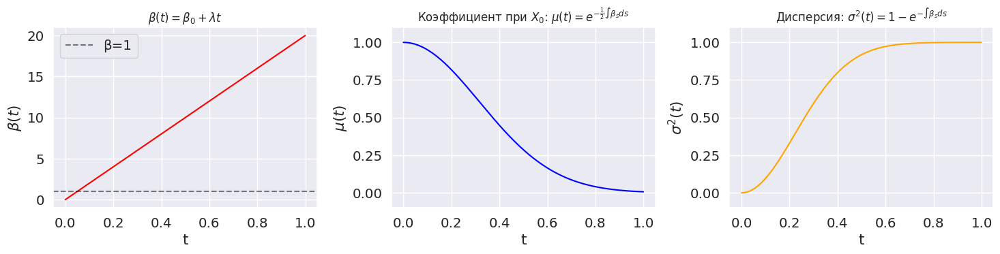

In [54]:
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

axes[0].plot(t_s, beta_t, color='red')
axes[0].set_title(r'$\beta(t) = \beta_0 + \lambda t$', fontsize=12)
axes[0].set_xlabel('t')
axes[0].set_ylabel(r'$\beta(t)$')
axes[0].grid(True)
axes[0].axhline(y=1, color='black', linestyle='--', alpha=0.5, label='β=1')
axes[0].legend()

axes[1].plot(t_s, mu_t, color='blue')
axes[1].set_title(r'Коэффициент при $X_0$: $\mu(t) = e^{-\frac{1}{2}\int\beta_s ds}$', fontsize=12)
axes[1].set_xlabel('t')
axes[1].set_ylabel(r'$\mu(t)$')
axes[1].grid(True)
axes[1].set_ylim(-0.1, 1.1)

axes[2].plot(t_s, var_t, color='orange')
axes[2].set_title(r'Дисперсия: $\sigma^2(t) = 1 - e^{-\int\beta_s ds}$', fontsize=12)
axes[2].set_xlabel('t')
axes[2].set_ylabel(r'$\sigma^2(t)$')
axes[2].grid(True)
axes[2].set_ylim(-0.1, 1.1)

plt.tight_layout()
plt.show()

**3.**  Будем использовать простой двумерный датасет. Код генерации данных представлен ниже. Визуализируйте процесс зашумления данных для моментов времени $t$ равномерно выбранных на отрезке $[0, 1]$.

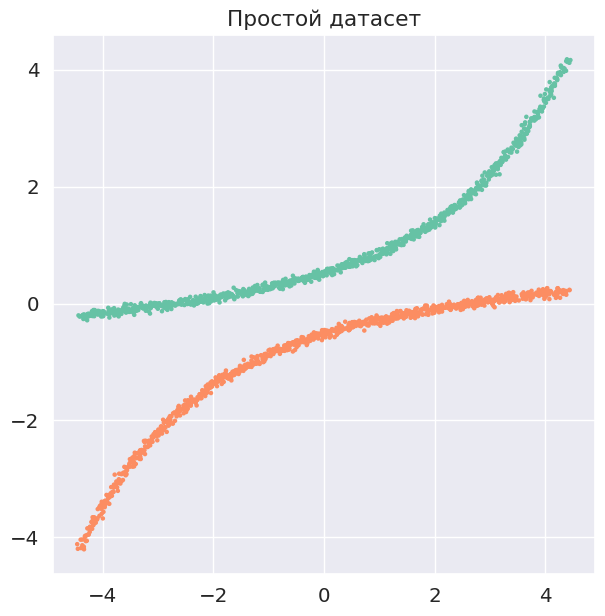

In [55]:
# Количество точек в данных
data_size = 2000

# Данные
x = torch.linspace(-2.2, 2.2, data_size // 2).view((-1, 1))
data1 = torch.cat([x * 2, (torch.exp(x + 2) + 3 * x + 2) / 18], 1)
data2 = torch.cat([x * 2, (-torch.exp(-x + 2) + 3 * x - 2) / 18], 1)
data = torch.cat([data1, data2])
data += torch.randn(data.shape) * 0.04

# Метки
labels = torch.zeros(data_size).view((-1, 1))
labels[data_size // 2:] = 1

# Визуализация
pallete = sns.color_palette("Set2")
colors = [pallete[0]] * (data_size // 2) + [pallete[1]] * (data_size // 2)
plt.figure(figsize=(7, 7))
plt.scatter(data[:, 0], data[:, 1], s=5, c=colors)
plt.title("Простой датасет");

In [56]:
def diffuse_data(data, t, mu_t, var_t, delta_t):
    mu = mu_t[int(t / delta_t)]
    var = var_t[int(t / delta_t)]
    noise = torch.randn_like(data)
    diffused_data = mu * data + torch.sqrt(var) * noise
    return diffused_data

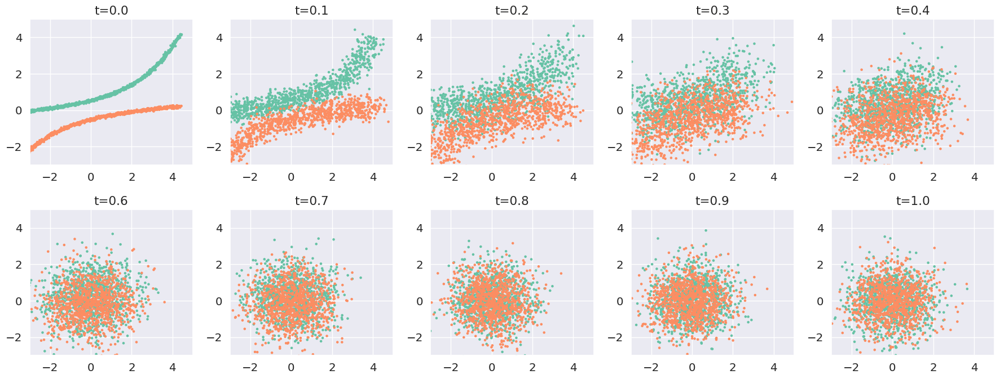

In [57]:
fig, axes = plt.subplots(2, 5, figsize=(18, 7))
axes = axes.flatten()

for i, t in enumerate(np.linspace(0, 0.99, 10)):
    data_t = diffuse_data(data, t, mu_t, var_t, delta_t)
    axes[i].scatter(data_t[:,0], data_t[:,1], s=5, c=colors)
    axes[i].set_title(f"t={t:.1f}")
    axes[i].set_xlim(-3,5)
    axes[i].set_ylim(-3,5)

plt.tight_layout()
plt.show()


**4.** Обучите диффузионную модель с непрерывным временем на простом датасете. 
* Обучение может занять много времени &mdash; используйте много итераций.
* Вам может понадобиться клип градиентов модели.
* Визуализуйте лосс. Он будет очень шумным. Используйте лог-масштаб по оси y.

In [58]:
class MyDiffModel(nn.Module):
    def __init__(self, input_dim, n_classes, guidance_scale=3.0):
        super().__init__()
        self.guidance_scale = guidance_scale
        self.n_classes = n_classes

        self.feature_extractor = nn.Sequential(
            nn.Linear(input_dim + 1, 128), nn.SiLU(), nn.Linear(128, 128), nn.SiLU()
        )

        self.uncond_score_head = nn.Sequential(
            nn.Linear(128, 64), nn.SiLU(), nn.Linear(64, input_dim)
        )

        self.class_head = nn.Sequential(
            nn.Linear(128, 64), nn.SiLU(), nn.Linear(64, n_classes)
        )

    def forward(self, x, t, y=None):
        """
        x: (batch_size, input_dim) - зашумленные данные
        t: (batch_size,) - временные шаги
        y: (batch_size,) - целевые классы (опционально для guidance)
        """
        t = t.view(-1, 1).expand(x.size(0), 1)
        xt = torch.cat([x, t], dim=1)

        features = self.feature_extractor(xt)

        unconditional_score = self.uncond_score_head(features)

        if y is None:
            return unconditional_score, None

        x.requires_grad_(True)

        xt_grad = torch.cat([x, t], dim=1)
        features_grad = self.feature_extractor(xt_grad)
        logits = self.class_head(features_grad)
        log_probs = F.log_softmax(logits, dim=-1)

        selected_log_probs = log_probs[torch.arange(x.size(0)), y]

        cond_score = torch.autograd.grad(
            outputs=selected_log_probs.sum(), inputs=x, create_graph=True
        )[0]

        x.requires_grad_(False)

        guided_score = unconditional_score + self.guidance_scale * cond_score

        return guided_score, logits

In [59]:
def plot_loss(losses, title="Training Loss", log_scale=True):
    """Визуализация лосса."""
    plt.figure(figsize=(10, 6))
    plt.plot(losses, alpha=0.7, color='blue')
    if log_scale:
        plt.yscale('log')
    plt.xlabel('Epoch')
    plt.ylabel('Loss' + (' (log scale)' if log_scale else ''))
    plt.title(title)
    plt.grid(True, alpha=0.3)
    plt.show()

In [60]:
INPUT_DIM = 2
N_CLASSES = 2
BATCH_SIZE = 256
N_EPOCHS = 600
LR = 1e-3
GRADIENT_CLIP = 1.0
UNCOND_PROB = 0.1

In [61]:
def compute_diffusion_params(beta_0, lamb, t):
    t = np.asarray(t)
    t = np.clip(t, 1e-5, 0.9999)
    
    integral_beta = beta_0 * t + 0.5 * lamb * (t**2)
    
    integral_beta = np.clip(integral_beta, 1e-8, 10.0)
    
    alpha_t = np.exp(-0.5 * integral_beta)
    var_t = 1 - np.exp(-integral_beta)
    
    alpha_t = np.clip(alpha_t, 1e-6, 0.9999)
    var_t = np.clip(var_t, 1e-6, 0.9999)
    
    return alpha_t, var_t

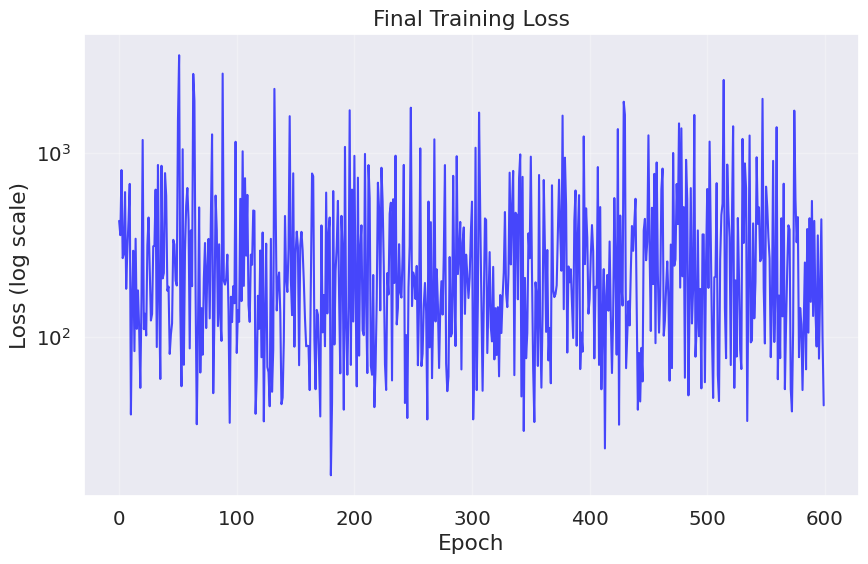

In [62]:
data = data.to(device)
labels = labels.squeeze().long().to(device)
dataset = TensorDataset(data, labels)
dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)

model = MyDiffModel(input_dim=INPUT_DIM, n_classes=N_CLASSES).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=LR)

losses = []
plot_every = 20

print("Starting training...")
for epoch in tqdm(range(N_EPOCHS), desc="Epochs"):
    epoch_losses = []

    for batch_data, batch_labels in dataloader:
        batch_data = batch_data.to(device)
        batch_labels = batch_labels.to(device)

        t = torch.rand(batch_data.size(0), device=device)

        alpha_t = torch.zeros_like(t)
        var_t = torch.zeros_like(t)
        for i, ti in enumerate(t):
            a, v = compute_diffusion_params(beta_0, lamb, ti.item())
            alpha_t[i] = a
            var_t[i] = v

        noise = torch.randn_like(batch_data)
        x_t = alpha_t.view(-1, 1) * batch_data + torch.sqrt(var_t).view(-1, 1) * noise

        if torch.rand(1).item() < UNCOND_PROB:
            batch_labels = None

        optimizer.zero_grad()
        if batch_labels is None:
            score_pred, _ = model(x_t, t, y=None)
        else:
            score_pred, _ = model(x_t, t, y=batch_labels)

        score_target = -noise / torch.sqrt(var_t).view(-1, 1)
        loss = nn.functional.mse_loss(score_pred, score_target)
        loss.backward()

        nn.utils.clip_grad_norm_(model.parameters(), GRADIENT_CLIP)
        optimizer.step()

        epoch_losses.append(loss.item())

    avg_loss = np.mean(epoch_losses)
    losses.append(avg_loss)

    if (epoch + 1) % 50 == 0:
        print(f"Epoch {epoch+1}/{N_EPOCHS}, Loss: {avg_loss:.6f}")

    if (epoch + 1) % plot_every == 0:
        clear_output(wait=True)
        plot_loss(losses, title=f"Training Loss after {epoch+1} epochs")

clear_output(wait=True)
plot_loss(losses, title="Final Training Loss")

**5.** Визуализируйте результат генерации модели для 1000, 100 и 50 шагов в режиме семплирования СДУ.

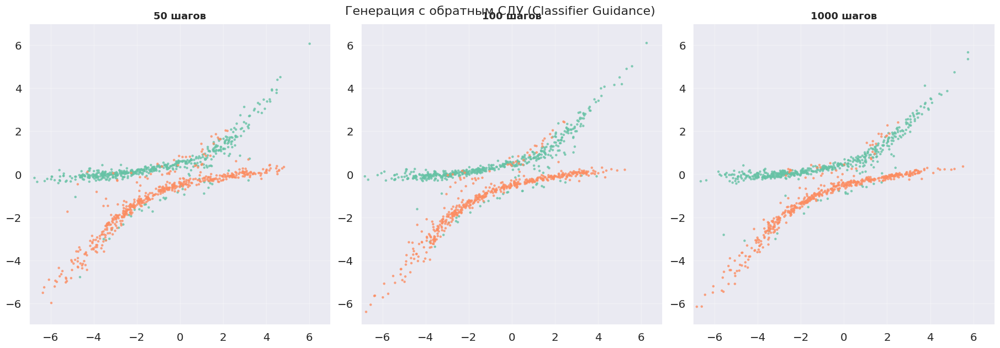

In [63]:
def generate_data_sde(model, n_samples, n_steps, target_class, device='cuda'):
    """Генерация данных с помощью обратного СДУ с classifier guidance"""
    T = 1.0
    time_grid = np.linspace(T, 0, n_steps + 1)
    dt = -T / n_steps
    
    x = torch.randn(n_samples, 2, device=device)
    
    for i in range(n_steps):
        t = time_grid[i]
        beta_t_val = beta_0 + lamb * t
        
        x_input = x.clone().requires_grad_(True)
        guided_score, _ = model(x_input, torch.full((x.shape[0],), t, device=device), y=target_class)
        
        drift = -0.5 * beta_t_val * x - beta_t_val * guided_score.detach()
        diffusion = np.sqrt(beta_t_val * abs(dt)) * torch.randn_like(x)
        x = x + drift * dt + diffusion
    
    return x.cpu().numpy()

model.eval()

steps_to_test = [50, 100, 1000]
n_per_class = 500
palette = sns.color_palette("Set2")

fig, axes = plt.subplots(1, 3, figsize=(18, 6), constrained_layout=True)

for idx, n_steps in enumerate(steps_to_test):
    data0 = generate_data_sde(model, n_per_class, n_steps, 0, device)
    data1 = generate_data_sde(model, n_per_class, n_steps, 1, device)
    
    all_data = np.vstack([data0, data1])
    colors = [palette[0]] * n_per_class + [palette[1]] * n_per_class
    
    axes[idx].scatter(all_data[:, 0], all_data[:, 1], s=5, c=colors, alpha=0.7)
    axes[idx].set_title(f'{n_steps} шагов', fontsize=13, fontweight='bold')
    axes[idx].set_xlim(-7, 7)
    axes[idx].set_ylim(-7, 7)
    axes[idx].grid(True, alpha=0.3)
    axes[idx].set_aspect('equal')

fig.suptitle('Генерация с обратным СДУ (Classifier Guidance)', fontsize=16, y=1.02)
plt.show()

**6.** Визуализируйте результат генерации модели для 1000, 100 и 50 шагов в режиме семплирования ОДУ.

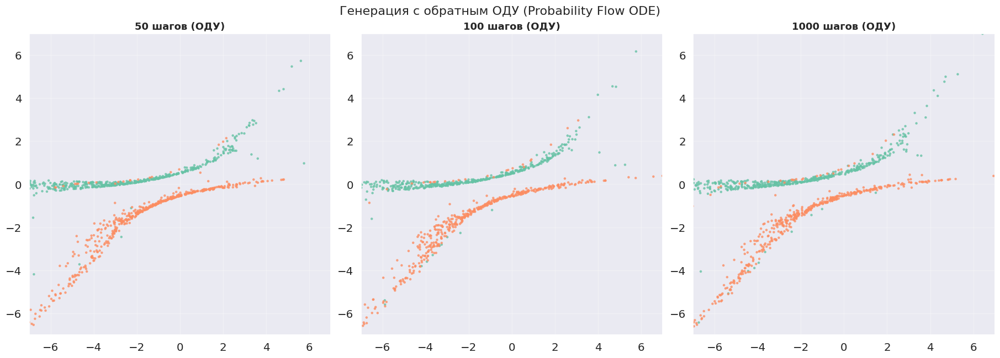

In [64]:
def generate_data_ode(model, n_samples, n_steps, target_class, device='cuda'):
    """Генерация данных с помощью обратного ОДУ (Probability Flow ODE)"""
    T = 1.0
    time_grid = np.linspace(T, 0, n_steps + 1)
    dt = -T / n_steps
    
    x = torch.randn(n_samples, 2, device=device)
    
    for i in range(n_steps):
        t = time_grid[i]
        beta_t_val = beta_0 + lamb * t
        
        x_input = x.clone().requires_grad_(True)
        guided_score, _ = model(x_input, torch.full((x.shape[0],), t, device=device), y=target_class)
        
        drift = -0.5 * beta_t_val * x - 0.5 * beta_t_val * guided_score.detach()
        x = x + drift * dt
    
    return x.cpu().numpy()

model.to(device)
model.eval()

steps_to_test = [50, 100, 1000]
n_per_class = 500
palette = sns.color_palette("Set2")

fig, axes = plt.subplots(1, 3, figsize=(18, 6), constrained_layout=True)

for idx, n_steps in enumerate(steps_to_test):
    data0 = generate_data_ode(model, n_per_class, n_steps, 0, device)
    data1 = generate_data_ode(model, n_per_class, n_steps, 1, device)
    
    all_data = np.vstack([data0, data1])
    colors = [palette[0]] * n_per_class + [palette[1]] * n_per_class
    
    axes[idx].scatter(all_data[:, 0], all_data[:, 1], s=5, c=colors, alpha=0.7)
    axes[idx].set_title(f'{n_steps} шагов (ОДУ)', fontsize=13, fontweight='bold')
    axes[idx].set_xlim(-7, 7)
    axes[idx].set_ylim(-7, 7)
    axes[idx].grid(True, alpha=0.3)
    axes[idx].set_aspect('equal')

fig.suptitle('Генерация с обратным ОДУ (Probability Flow ODE)', fontsize=16, y=1.05)
plt.show()

**7.** Оцените логарифм плотности для объектов двумерной сетки и визуализируйте его.

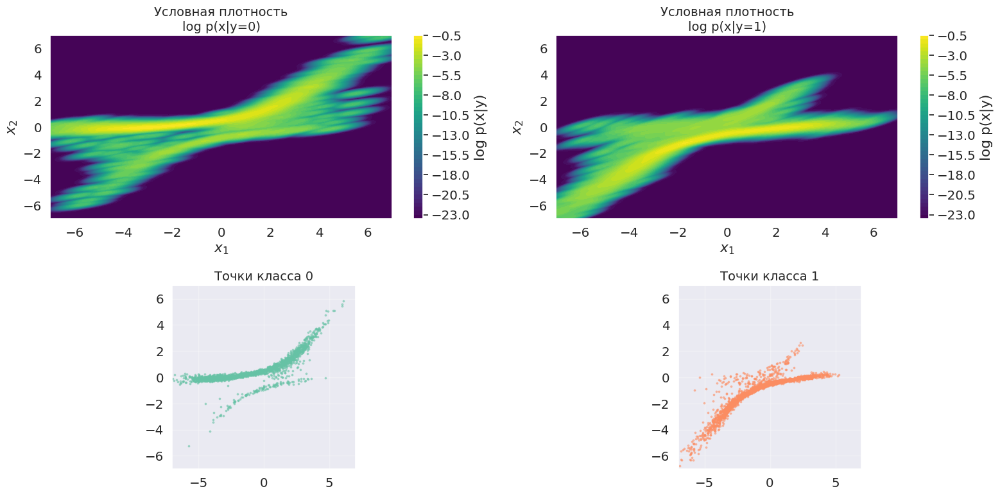

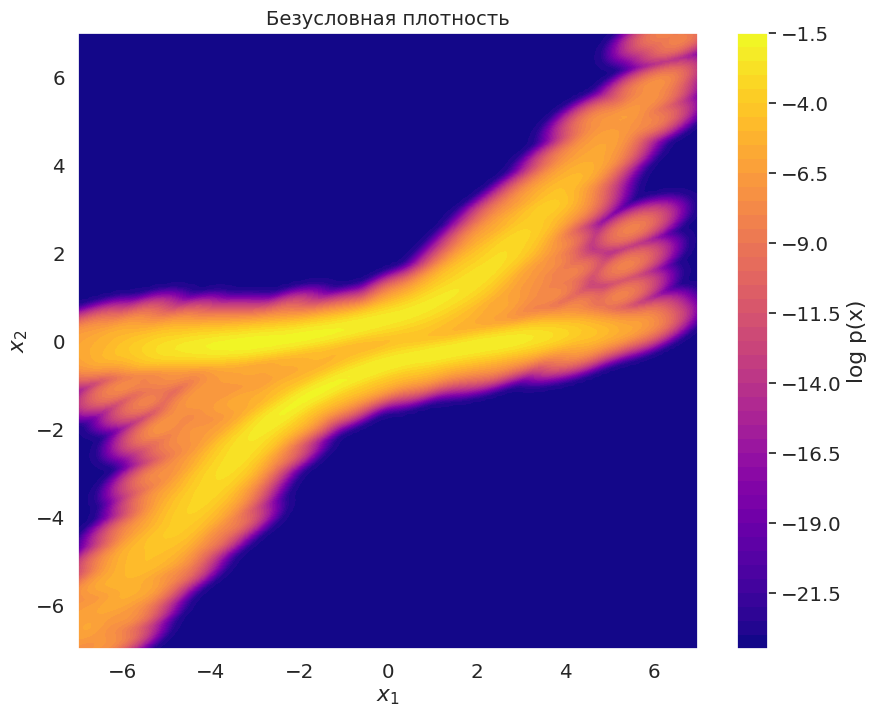

In [65]:
x_range = np.linspace(-7, 7, 200)
y_range = np.linspace(-7, 7, 200)
X, Y = np.meshgrid(x_range, y_range)
positions = np.vstack([X.ravel(), Y.ravel()])

samples_per_class = {}
n_samples_per_class = 10000
n_classes = N_CLASSES

fig = plt.figure(figsize=(8 * n_classes, 8))

for class_id in range(n_classes):
    class_labels = torch.full((n_samples_per_class,), class_id, device=device)
    
    class_samples = generate_data_sde(
        model=model,
        n_samples=n_samples_per_class,
        n_steps=1000,
        target_class=class_labels,
        device=device
    )
    
    samples_per_class[class_id] = class_samples
    
    kde = gaussian_kde(class_samples.T, bw_method=0.1)
    density = kde(positions).reshape(X.shape)
    log_density = np.log(density + 1e-10)
    
    ax1 = plt.subplot(2, n_classes, class_id + 1)
    cont = ax1.contourf(X, Y, log_density, levels=50, cmap='viridis')
    ax1.set_title(f'Условная плотность\nlog p(x|y={class_id})', fontsize=14)
    ax1.set_xlabel('$x_1$')
    ax1.set_ylabel('$x_2$')
    ax1.grid(True, alpha=0.3)
    plt.colorbar(cont, ax=ax1, label='log p(x|y)')
    
    ax2 = plt.subplot(2, n_classes, n_classes + class_id + 1)
    ax2.scatter(
        class_samples[:2000, 0], 
        class_samples[:2000, 1],
        s=3, alpha=0.5, color=f'C{class_id}', rasterized=True
    )
    ax2.set_title(f'Точки класса {class_id}', fontsize=14)
    ax2.set_xlim(-7, 7)
    ax2.set_ylim(-7, 7)
    ax2.grid(True, alpha=0.3)
    ax2.set_aspect('equal')

plt.tight_layout()
plt.show()

all_samples = np.vstack([samples_per_class[c] for c in range(n_classes)])
kde = gaussian_kde(all_samples.T, bw_method=0.1)
density = kde(positions).reshape(X.shape)
log_density = np.log(density + 1e-10)

plt.figure(figsize=(10, 8))
plt.contourf(X, Y, log_density, levels=50, cmap='plasma')
plt.colorbar(label='log p(x)')
plt.title('Безусловная плотность', fontsize=14)
plt.xlabel('$x_1$')
plt.ylabel('$x_2$')
plt.grid(True, alpha=0.3)
plt.show()

**8.** Сделайте выводы.

Видим, что плотности при условии каждого класса действительно повторяют истинные данные. 

**9.** Обучите модель на датасете MNIST. Обучение может занять очень много времени. Возможно, вам будет полезно поиграться с настройками обучения: шедулер скорости обучения, клип градиентов, регуляризация весов, &mdash;  выбора $t$ при обучении, усреднение весов [EMA](https://pytorch.org/docs/stable/optim.html#weight-averaging-swa-and-ema) и т.д. Визуализируйте лосс аналогично п. 4.

Для MNIST нужно заменить обычные MLP на свертки, а также немного поменять функцию обучения.

In [75]:
class SinusoidalTimeEmbedding(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim
    
    def forward(self, t):
        """t: (batch,) в диапазоне [0, 1]"""
        device = t.device
        half_dim = self.dim // 2
        emb = torch.log(torch.tensor(10000.0, device=device)) / (half_dim - 1 + 1e-6)
        emb = torch.exp(torch.arange(half_dim, device=device) * -emb)
        emb = t[:, None] * emb[None, :]
        emb = torch.cat([torch.sin(emb), torch.cos(emb)], dim=-1)
        return emb  # (batch, dim)
    
class MyDiffModelMNIST(nn.Module):
    def __init__(self, n_classes=10, guidance_scale=3.0):
        super().__init__()
        self.guidance_scale = guidance_scale
        self.n_classes = n_classes
        
        self.time_embedding = nn.Sequential(
            SinusoidalTimeEmbedding(128),
            nn.Linear(128, 128), nn.SiLU(),
            nn.Linear(128, 256)
        )
        
        self.time_proj1 = nn.Linear(256, 32)
        self.time_proj2 = nn.Linear(256, 64)
        self.time_proj3 = nn.Linear(256, 128)
        self.time_proj4 = nn.Linear(256, 256)
        
        self.enc1 = self._conv_block(1, 32)
        self.enc2 = self._conv_block(32, 64)
        self.enc3 = self._conv_block(64, 128)
        self.enc4 = self._conv_block(128, 256)
        
        self.mid = self._conv_block(256, 256)
        
        self.dec4 = self._conv_block(256 + 256, 128)
        self.dec3 = self._conv_block(128 + 128, 64)
        self.dec2 = self._conv_block(64 + 64, 32)
        self.dec1 = self._conv_block(32 + 32, 32)
        
        self.final_conv = nn.Conv2d(32, 1, 3, padding=1)
        
        self.pool = nn.MaxPool2d(2)
        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        
    def _conv_block(self, in_ch, out_ch):
        return nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch), nn.SiLU(),
            nn.Conv2d(out_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch), nn.SiLU()
        )
    
    def forward(self, x, t, y=None):
        b = x.size(0)
        
        t_emb = self.time_embedding(t)  # (b, 256)
        t1 = self.time_proj1(t_emb).view(b, -1, 1, 1)
        t2 = self.time_proj2(t_emb).view(b, -1, 1, 1)
        t3 = self.time_proj3(t_emb).view(b, -1, 1, 1)
        t4 = self.time_proj4(t_emb).view(b, -1, 1, 1)
        
        e1 = self.enc1(x) + t1          # (b, 32, 28, 28)
        e2 = self.enc2(self.pool(e1)) + t2  # (b, 64, 14, 14)
        e3 = self.enc3(self.pool(e2)) + t3  # (b, 128, 7, 7)
        e4 = self.enc4(self.pool(e3)) + t4  # (b, 256, 3, 3)
        
        m = self.mid(self.pool(e4))     # (b, 256, 1, 1)
        
        up_m = self.upsample(m)         # (b, 256, 2, 2)
        up_m = F.interpolate(up_m, size=e4.shape[2:], mode='bilinear', align_corners=True)  # (b, 256, 3, 3)
        d4 = self.dec4(torch.cat([up_m, e4], dim=1))  # (b, 128, 3, 3)
        
        up_d4 = self.upsample(d4)       # (b, 128, 6, 6)
        up_d4 = F.interpolate(up_d4, size=e3.shape[2:], mode='bilinear', align_corners=True)  # (b, 128, 7, 7)
        d3 = self.dec3(torch.cat([up_d4, e3], dim=1))  # (b, 64, 7, 7)
        
        up_d3 = self.upsample(d3)       # (b, 64, 14, 14)
        up_d3 = F.interpolate(up_d3, size=e2.shape[2:], mode='bilinear', align_corners=True)  # (b, 64, 14, 14)
        d2 = self.dec2(torch.cat([up_d3, e2], dim=1))  # (b, 32, 14, 14)
        
        up_d2 = self.upsample(d2)       # (b, 32, 28, 28)
        up_d2 = F.interpolate(up_d2, size=e1.shape[2:], mode='bilinear', align_corners=True)  # (b, 32, 28, 28)
        d1 = self.dec1(torch.cat([up_d2, e1], dim=1))  # (b, 32, 28, 28)
        
        return self.final_conv(d1)  # (b, 1, 28, 28)

In [76]:
def compute_diffusion_params_torch(beta_0, lamb, t):
    """Вычисляет alpha_t, var_t, beta(t) для VP-SDE"""
    t = torch.clamp(t, min=0.0, max=1.0)
    integral_beta = beta_0 * t + 0.5 * lamb * t**2
    
    alpha_t = torch.exp(-0.5 * integral_beta)
    var_t = 1 - torch.exp(-integral_beta)
    beta_t = beta_0 + lamb * t
    
    return alpha_t, var_t, beta_t

In [77]:
BATCH_SIZE = 128
LR = 1e-4
N_EPOCHS = 300
GRADIENT_CLIP = 1.0
UNCOND_PROB = 0.1
plot_every = 1
beta_0, lamb = 0.1, 5.0

In [78]:
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])

mnist_train = MNIST(root='./data', train=True, download=True, transform=transform)
dataloader = DataLoader(mnist_train, batch_size=BATCH_SIZE, shuffle=True)

In [79]:
def plot_loss(losses, title="Training Loss"):
    plt.figure(figsize=(10, 6))
    
    if not losses:
        plt.text(0.5, 0.5, 'No valid loss data available', 
                 horizontalalignment='center',
                 verticalalignment='center',
                 fontsize=14,
                 transform=plt.gca().transAxes)
        plt.title('Training Loss - No Data')
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()
        return
    
    valid_losses = []
    valid_epochs = []
    
    for epoch, loss in enumerate(losses, 1):
        if not (np.isnan(loss) or np.isinf(loss) or loss > 1000 or loss < 0):
            valid_losses.append(loss)
            valid_epochs.append(epoch)
    
    if not valid_losses:
        plt.text(0.5, 0.5, 'No valid loss values to plot', 
                 horizontalalignment='center',
                 verticalalignment='center',
                 fontsize=14,
                 transform=plt.gca().transAxes)
        plt.title('Training Loss - No Valid Data')
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()
        return
    
    plt.semilogy(valid_epochs, valid_losses, 'b-', linewidth=2, marker='o', markersize=4)
    
    plt.title(title, fontsize=14)
    plt.xlabel('Epoch', fontsize=12)
    plt.ylabel('Loss (log scale)', fontsize=12)
    plt.grid(True, which="both", ls="--", alpha=0.7)
    plt.tight_layout()
    
    plt.show()

In [80]:
model = MyDiffModelMNIST(n_classes=10).to(device)
optimizer = torch.optim.AdamW(model.parameters(), lr=LR, weight_decay=1e-4)
ema_model = torch.optim.swa_utils.AveragedModel(
    model, multi_avg_fn=torch.optim.swa_utils.get_ema_multi_avg_fn(0.999)
)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=N_EPOCHS)

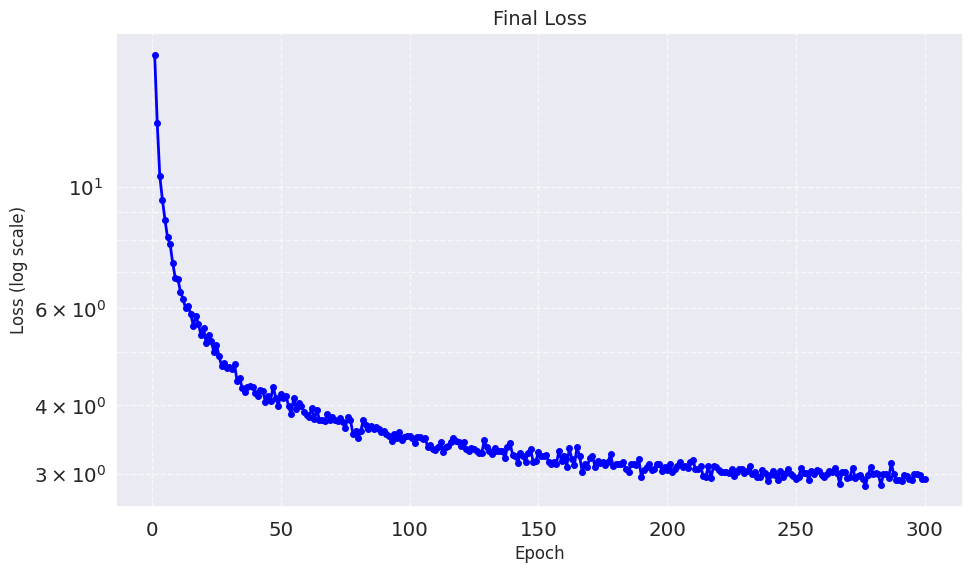

In [81]:
losses = []

for epoch in range(N_EPOCHS):
    epoch_losses = []

    for batch_data, batch_labels in tqdm(dataloader, desc=f"Epoch {epoch}"):
        batch_data = batch_data.to(device)
        batch_labels = batch_labels.to(device)

        uncond_mask = torch.rand(batch_data.size(0), device=device) < UNCOND_PROB
        batch_labels_for_model = batch_labels.clone()
        batch_labels_for_model[uncond_mask] = -1

        if torch.rand(1).item() < UNCOND_PROB:
            batch_labels_for_model = None
        else:
            batch_labels_for_model = batch_labels

        t = torch.rand(batch_data.size(0), device=device)
        t = torch.clamp(t, min=0.01, max=0.99)

        alpha_t, var_t, _ = compute_diffusion_params_torch(beta_0, lamb, t)
        alpha_t = alpha_t.view(-1, 1, 1, 1)
        var_t = var_t.view(-1, 1, 1, 1)

        noise = torch.randn_like(batch_data)
        x_t = alpha_t * batch_data + torch.sqrt(var_t) * noise

        score_pred = model(x_t, t, y=batch_labels_for_model)

        score_target = -noise / torch.sqrt(var_t)

        loss = F.mse_loss(score_pred, score_target)

        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), GRADIENT_CLIP)
        optimizer.step()

        ema_model.update_parameters(model)

        epoch_losses.append(loss.item())

    scheduler.step()
    losses.append(np.mean(epoch_losses))

    if (epoch + 1) % plot_every == 0:
        clear_output(wait=True)
        plot_loss(losses, f"Training Loss (epoch {epoch+1})")

clear_output(wait=True)
plot_loss(losses, "Final Loss")

**10.** Визуализируйте результаты обучения модели. Также оцените плотность некоторых объектов обучающей выборки. Какие объекты имеют большую плотность, какие &mdash; меньшую?

In [82]:
def compute_diffusion_params_torch(beta_0, lamb, t, eps=1e-8):
    integral_beta = beta_0 * t + 0.5 * lamb * (t**2)
    integral_beta = torch.clamp(integral_beta, min=eps, max=10.0)

    alpha_t = torch.exp(-0.5 * integral_beta)
    var_t = 1 - torch.exp(-integral_beta)
    
    alpha_t = torch.clamp(alpha_t, eps, 1-eps)
    var_t   = torch.clamp(var_t, eps, 1-eps)

    beta_t = beta_0 + lamb * t

    return alpha_t, var_t, beta_t

In [83]:
def generate_continuous(
    model, n_samples_per_class, n_steps, device, batch_size=32, guidance_scale=3.0
):
    """
    Генерация с classifier-free guidance
    """
    model.eval()

    images = []

    for class_id in tqdm(range(10), desc="Generating"):
        labels = torch.full((n_samples_per_class,), class_id, device=device)

        for start in range(0, n_samples_per_class, batch_size):
            end = min(start + batch_size, n_samples_per_class)
            b = end - start

            x = torch.randn(b, 1, 28, 28, device=device)
            y = labels[start:end]

            t_steps = torch.linspace(1.0, 0.0, n_steps, device=device)
            dt = -1.0 / n_steps

            with torch.no_grad():
                for t in t_steps:
                    t_b = torch.full((b,), t, device=device)

                    score_cond = model(x, t_b, y=y)
                    score_uncond = model(x, t_b, y=None)

                    score = score_uncond + guidance_scale * (score_cond - score_uncond)

                    _, _, beta_t = compute_diffusion_params_torch(beta_0, lamb, t_b)
                    beta_t = beta_t.view(-1, 1, 1, 1)

                    dx = -0.5 * beta_t * (x + score) * dt
                    x = x + dx

                    x = torch.clamp(x, -4, 4)

            images.append(x.cpu())

    return torch.cat(images, dim=0)

Generating:   0%|          | 0/10 [00:00<?, ?it/s]

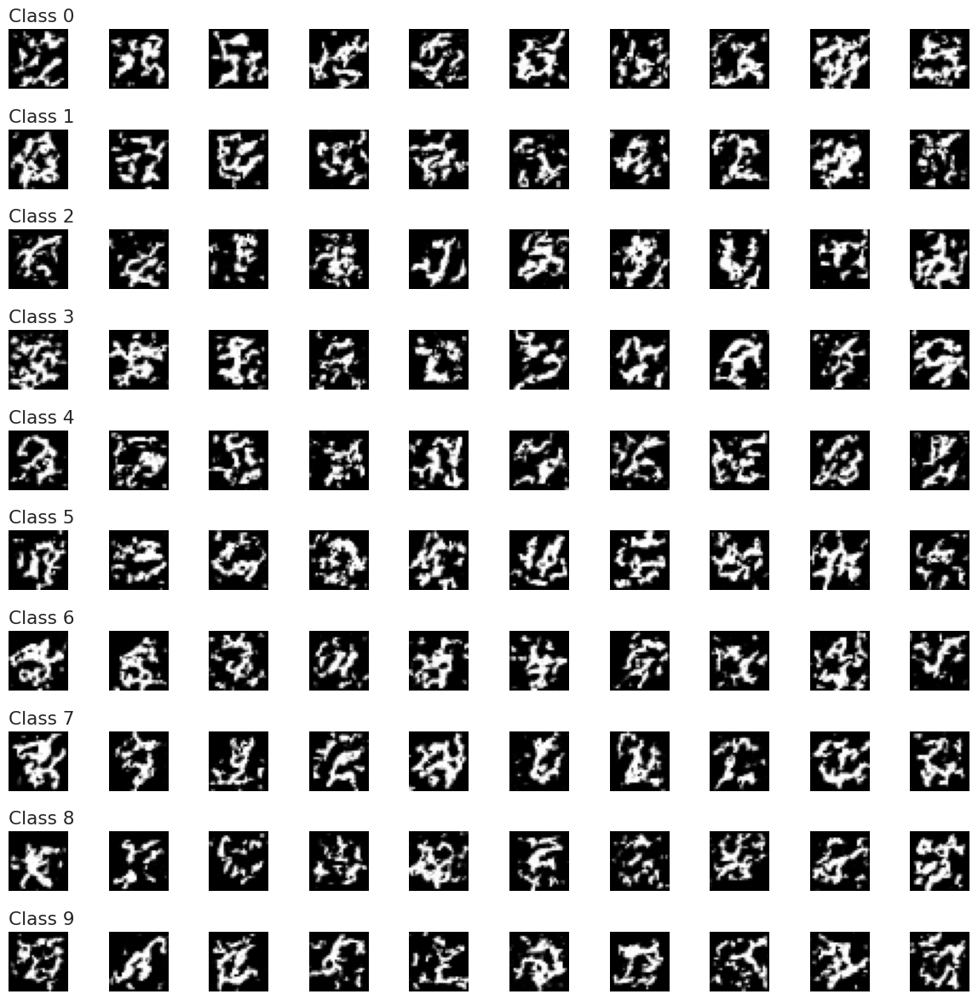

In [84]:
generated = generate_continuous(
    ema_model, 
    n_samples_per_class=10, 
    n_steps=100, 
    device=device,
    guidance_scale=3.0
)

fig, axes = plt.subplots(10, 10, figsize=(12, 12))
for i in range(100):
    img = generated[i, 0]
    img = (img + 1) / 2
    img = torch.clamp(img, 0, 1)
    axes[i//10, i%10].imshow(img, cmap='gray')
    axes[i//10, i%10].axis('off')
    if i % 10 == 0:
        axes[i//10, i%10].set_title(f'Class {i//10}', loc='left')
plt.tight_layout()
plt.show()

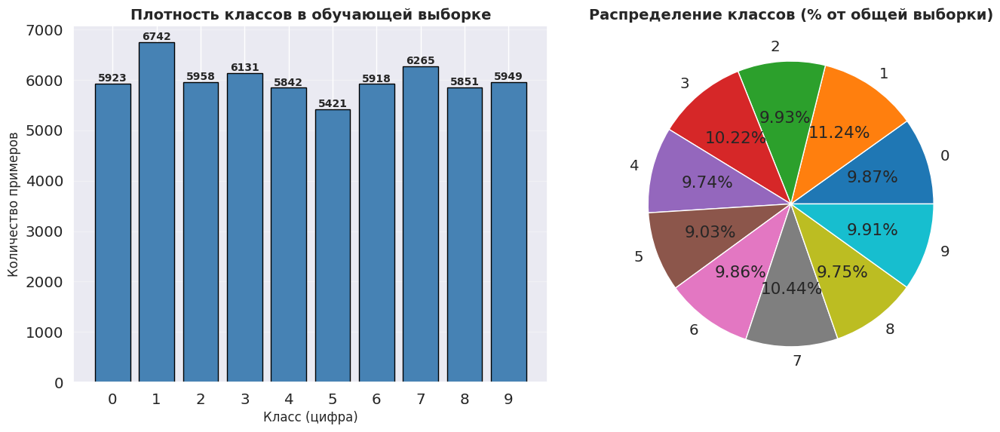


СТАТИСТИКА ПЛОТНОСТИ КЛАССОВ
Класс    Количество      Процент      Визуализация
-------------------------------------------------------
0        5923            9.87       % ███████████████████
1        6742            11.24      % ██████████████████████
2        5958            9.93       % ███████████████████
3        6131            10.22      % ████████████████████
4        5842            9.74       % ███████████████████
5        5421            9.04       % ██████████████████
6        5918            9.86       % ███████████████████
7        6265            10.44      % ████████████████████
8        5851            9.75       % ███████████████████
9        5949            9.92       % ███████████████████
Всего изображений: 60,000

Самый редкий класс:  5 (5421 примеров)
Самый частый класс:   1 (6742 примеров)
Дисбаланс: 1.24x


tensor([5923, 6742, 5958, 6131, 5842, 5421, 5918, 6265, 5851, 5949])

In [86]:
def visualize_training_density(dataloader, n_classes=10):
    """
    Анализирует и визуализирует плотность классов в обучающих данных
    """
    class_counts = torch.zeros(n_classes, dtype=torch.long)
    
    for _, labels in dataloader:
        for label in labels:
            class_counts[label.item()] += 1
    
    plt.figure(figsize=(14, 6))
    
    plt.subplot(1, 2, 1)
    classes = [str(i) for i in range(n_classes)]
    bars = plt.bar(classes, class_counts.numpy(), color='steelblue', edgecolor='black')
    plt.xlabel('Класс (цифра)', fontsize=12)
    plt.ylabel('Количество примеров', fontsize=12)
    plt.title('Плотность классов в обучающей выборке', fontsize=14, fontweight='bold')
    plt.xticks(classes)
    plt.grid(axis='y', alpha=0.3)
    
    for bar, count in zip(bars, class_counts):
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height,
                f'{count}', ha='center', va='bottom', fontsize=10, fontweight='bold')
    
    plt.subplot(1, 2, 2)
    percentages = (class_counts.float() / class_counts.sum() * 100).numpy()
    colors = plt.cm.tab10(np.arange(n_classes))
    plt.pie(percentages, labels=classes, autopct='%1.2f%%', colors=colors)
    plt.title('Распределение классов (% от общей выборки)', fontsize=14, fontweight='bold')
    
    plt.tight_layout()
    plt.show()
    
    print("\n" + "="*55)
    print("СТАТИСТИКА ПЛОТНОСТИ КЛАССОВ")
    print("="*55)
    print(f"{'Класс':<8} {'Количество':<15} {'Процент':<12} {'Визуализация'}")
    print("-"*55)
    
    total = class_counts.sum().item()
    for i in range(n_classes):
        count = class_counts[i].item()
        pct = count / total * 100
        bar = "█" * int(pct * 2)
        print(f"{i:<8} {count:<15} {pct:<11.2f}% {bar}")
    
    print("="*55)
    print(f"Всего изображений: {total:,}")
    
    min_class = class_counts.argmin().item()
    max_class = class_counts.argmax().item()
    print(f"\nСамый редкий класс:  {min_class} ({class_counts[min_class]} примеров)")
    print(f"Самый частый класс:   {max_class} ({class_counts[max_class]} примеров)")
    print(f"Дисбаланс: {class_counts[max_class] / class_counts[min_class]:.2f}x")
    
    return class_counts

visualize_training_density(dataloader)

Как видим, распределение достаточно равномерное.

**Выводы:**

Мы провели эксперимент с простыми данными, и на них нам удалось заставить диффузионную модель с непрперывным временем выдавать неплохой результат.

В случае же MNIST мы видим, что долгое обучение и снижение лосса не привело к генерации качественных изображений, что говорит о крайней нестабильности и затратности данного метода. Безусловно, можно обучать модель еще дольше, но я не вижу это целесообразным, когда обычная диффузионная модель или GAN неплохо обучаюся буквално за 15 минут. Таким образом, данный способ подходит исключительно для задач исследования, генерировать какие то изображения с ним слишком затратно.

---
### Задача 2
Научите модель генерировать заданный объект где угодно и как угодно.

In [ ]:
import os
import torch
import numpy as np
import random
import logging
import matplotlib.pyplot as plt
import json

import torch
from torch.utils.data import Dataset, DataLoader
from torch import optim
import torch.nn.functional as F
from PIL import Image
import time
from datetime import datetime, timedelta
from torchvision import transforms
import gc

device = "cuda"
from peft import LoraConfig, get_peft_model, prepare_model_for_kbit_training
from peft import PeftModel
from accelerate import Accelerator
from diffusers import AutoPipelineForText2Image
from diffusers import StableDiffusionPipeline, ControlNetModel, UniPCMultistepScheduler
from diffusers import StableDiffusion3Pipeline
from diffusers import DiffusionPipeline
from diffusers import StableDiffusionXLPipeline, DPMSolverMultistepScheduler
from diffusers import UNet2DConditionModel, LMSDiscreteScheduler
from huggingface_hub import hf_hub_download


2025-12-11 01:16:15.642393: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-12-11 01:16:16.298321: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI AVX512_BF16 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-12-11 01:16:17.774877: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-12-11 01:16:17.779087: I external/local_xla/xla/tsl/cuda/cudart

**1.** В качестве объекта возьмите одного из героев советского мультфильма "Зима в Простоквашино" &mdash; кота Матроскина. Выберите модель Stable Diffusion или SDXL (скорее всего с ней будет проще разобраться дальше). Проверьте, может ли она генерировать изображения кота Матроскина.

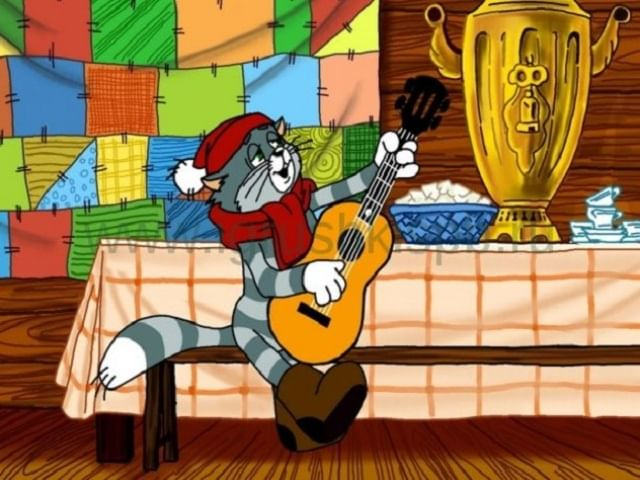

In [ ]:
pipe = StableDiffusionPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    torch_dtype=torch.float16,
    use_safetensors=True
).to("cuda:0")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!


In [ ]:
torch.cuda.empty_cache()
prompt = "Cat Matroskin is sitting by the stove in the village of Prostokvashino"
image = pipe(
    prompt=prompt,
    num_inference_steps=30,
    height=512,
    width=512,
).images[0]

  0%|          | 0/20 [00:00<?, ?it/s]

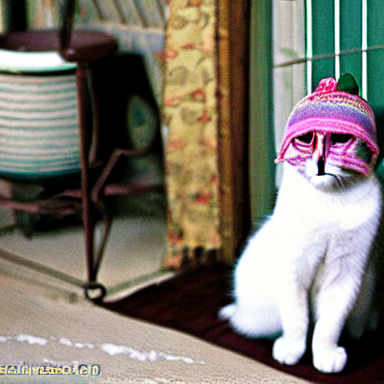

In [ ]:
display(image)
del image

**2.** Обучите модель выбранную на изображениях с котом Матроскиным.

Обучение предполагается провести с помощью метода [Dream Booth](https://arxiv.org/abs/2208.12242). Метод работает следующим образом. 
* Вы задаете специальный токен для выбранного объекта, например `<matroskin>`. 
* Делаете описания для нескольких примеров изображений объекта с помощью этого токена. 
* Дообучаете диффузионную модель с помощью лосса реконструкции, который сравнивает исходные изображения с генерацией, а также лосса сохранности, сравнивающего генерации новой модели для промптов без нового токена с генерациями исходной модели. Причем дообучение происходит с не всей модели целиком, а с помощью [LoRA](https://habr.com/ru/articles/747534/).

Схема обучения показана ниже. Более подробное описание метода на русском можно найти [здесь](https://habr.com/ru/articles/760920/).

Изображения с котом Матроскиным уже подготовлены специально для вас и лежат [здесь](https://disk.yandex.ru/d/ANMyV9ol8lbpQQ). Картинки были получены следующим образом: сначала были сделаны скриншоты кадров с нашим героем, а затем вырезаны области с котом с помощью [демо модели SAM](https://segment-anything.com/demo).

С практической точки зрения вам может помочь вот этот [пример](https://colab.research.google.com/github/huggingface/notebooks/blob/main/diffusers/SDXL_DreamBooth_LoRA_.ipynb) (не пропустите его).



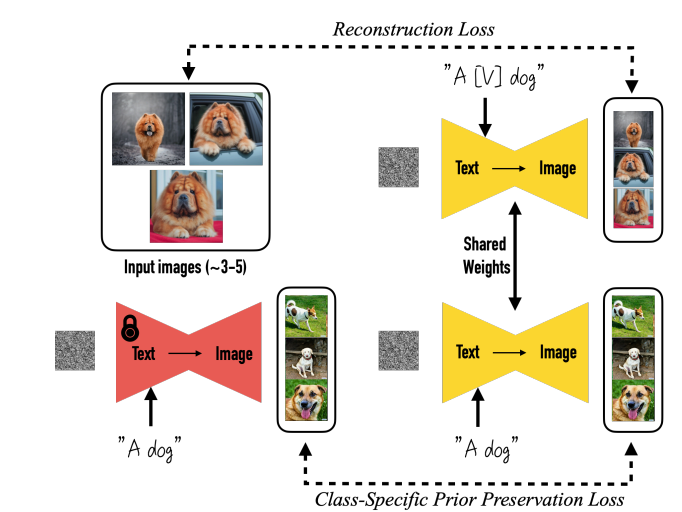

Загрузим изображения кота Матроскина

In [ ]:
input_dir = "/home/udeneev/DS_tasks/Кот Матроскин"
output_dir = "dataset"
images_dir = os.path.join(output_dir, "images")
os.makedirs(images_dir, exist_ok=True)

sam_images = []
filenames = sorted([f for f in os.listdir(input_dir) if f.lower().endswith((".png", ".jpg", ".jpeg"))])

for i, filename in enumerate(filenames, start=1):
    img_path = os.path.join(input_dir, filename)
    img = Image.open(img_path).convert("RGB")
    img = img.resize((512, 512), Image.LANCZOS)
    new_filename = f"img_{i:03d}.png"
    img.save(os.path.join(images_dir, new_filename))
    sam_images.append(new_filename)

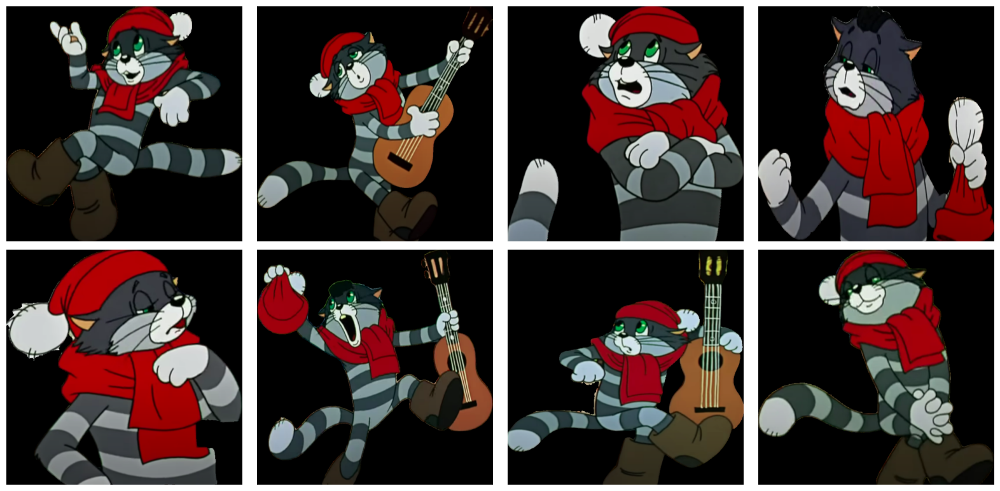

In [ ]:
fig, axes = plt.subplots(2, 4, figsize=(16, 8))

for i, ax in enumerate(axes.flatten()):
    if i < len(sam_images):
        img_path = os.path.join(images_dir, sam_images[i])
        img = Image.open(img_path)
        ax.imshow(img)
        ax.axis('off')
    else:
        ax.axis('off')

plt.tight_layout()
plt.show()

В примере в colab описание генерировала модель, но в нашем случае, так как изображений всего 8, то описания можно сделать вручную.

In [ ]:
captions = []

captions.append("<matroskin> talking")
captions.append("<matroskin> playing guitar and singing")
captions.append("<matroskin> disagreeing")
captions.append("<matroskin> threatening with a fist")
captions.append("<matroskin> licking its fur")
captions.append("<matroskin> excited")
captions.append("<matroskin> scared")
captions.append("<matroskin> happy")

preservation_captions = [
    "a cat talking",
    "a cat playing guitar", 
    "a cat disagreeing", 
    "a cat threatening with a fist",
    "a cat licking its fur",
    "a cat excited",
    "a cat scared",
    "a cat happy"
]

Подготовим наш датасет.

In [ ]:
output_dir = "dataset"
images_dir = os.path.join(output_dir, "images")
captions_dict = {img_name: caption for img_name, caption in zip(sam_images, captions)}
with open(os.path.join(output_dir, "captions.json"), "w", encoding="utf-8") as f:
    json.dump(captions_dict, f, ensure_ascii=False, indent=2)

Загрузим его в специальный класс

In [ ]:
class DreamBoothDataset(Dataset):
    def __init__(self, image_paths, captions, preservation_captions, resolution=512, dtype=torch.float16):
        self.image_paths = image_paths
        self.captions = captions
        self.preservation_captions = preservation_captions
        
        self.image_transform = transforms.Compose([
            transforms.Resize((resolution, resolution), Image.LANCZOS),
            transforms.RandomHorizontalFlip(p=0.5),
            transforms.ColorJitter(brightness=0.2, contrast=0.1, saturation=0.1),
            transforms.ToTensor(),
            transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
        ])
        self.dtype = dtype

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img = Image.open(self.image_paths[idx % len(self.image_paths)]).convert("RGB")
        pixel_values = self.image_transform(img).to(self.dtype)
        
        return {
            "pixel_values": pixel_values,
            "caption_with_token": self.captions[idx % len(self.captions)],
            "caption_without_token": self.preservation_captions[idx % len(self.preservation_captions)]
        }

In [ ]:
image_paths = [os.path.join(images_dir, f) for f in sam_images]

dataset = DreamBoothDataset(
    image_paths, 
    captions, 
    preservation_captions, 
    resolution=512,
    dtype=torch.float16
)

In [ ]:
new_token = "<matroskin>"
num_added_tokens = pipe.tokenizer.add_tokens(new_token)
pipe.text_encoder.resize_token_embeddings(len(pipe.tokenizer))

The new embeddings will be initialized from a multivariate normal distribution that has old embeddings' mean and covariance. As described in this article: https://nlp.stanford.edu/~johnhew/vocab-expansion.html. To disable this, use `mean_resizing=False`


Embedding(49409, 768)

In [ ]:
lora_config = LoraConfig(
    r=8,
    lora_alpha=16,
    target_modules=["to_k", "to_q", "to_v", "to_out.0", "add_k_proj", "add_v_proj"],
    init_lora_weights="gaussian",
)

pipe.unet.requires_grad_(False)
unet = get_peft_model(pipe.unet, lora_config)
pipe.unet = unet

In [ ]:
pipe_original = StableDiffusionPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    torch_dtype=torch.float16,
    use_safetensors=True,
).to("cuda:0")

pipe_original.unet.eval()
pipe_original.text_encoder.eval()
pipe_original.vae.eval();

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [ ]:
train_loader = DataLoader(dataset, batch_size=2, shuffle=True)

In [ ]:
def dreambooth_train_with_validation(
    pipe, pipe_original, train_loader, num_epochs=50,
    device="cuda:0", resolution=512, use_bf16=True, 
    lr=5e-4, preservation_weight=0.3,
    save_dir="./lora_weights",
    validation_prompts=None
):
    
    dtype = torch.bfloat16 if use_bf16 else torch.float16
    
    pipe.safety_checker = None
    pipe_original.safety_checker = None
    pipe = pipe.to(device, dtype=dtype)
    pipe_original = pipe_original.to(device, dtype=dtype)
    
    if hasattr(pipe.unet, "enable_gradient_checkpointing"):
        pipe.unet.enable_gradient_checkpointing()
    
    trainable_params = [p for p in pipe.unet.parameters() if p.requires_grad]
    if not trainable_params:
        raise ValueError("Нет обучаемых параметров!")
    
    optimizer = torch.optim.AdamW(trainable_params, lr=lr, weight_decay=1e-4)
    scaler = torch.amp.GradScaler('cuda') if not use_bf16 else None
    
    if validation_prompts is None:
        validation_prompts = [
            "photo of <cat> sitting",
            "photo of <cat> talking",
            "photo of <cat> happy",
        ]
    
    print(f"Начало обучения. Параметров: {sum(p.numel() for p in trainable_params):,}")
    print(f"Эпох: {num_epochs}, Батчей: {len(train_loader)}, Всего шагов: {num_epochs * len(train_loader)}")
    
    for epoch in range(num_epochs):
        pipe.unet.train()
        epoch_losses = []
        
        for batch_idx, batch in enumerate(train_loader):
            optimizer.zero_grad(set_to_none=True)
            
            # === Training ===
            images = batch["pixel_values"].to(device, dtype=dtype)
            
            captions_ids = pipe.tokenizer(
                batch["caption_with_token"],
                padding="max_length",
                truncation=True,
                max_length=77,
                return_tensors="pt"
            ).input_ids.to(device)
            
            latents = pipe.vae.encode(images).latent_dist.sample() * pipe.vae.config.scaling_factor
            noise = torch.randn_like(latents)
            timesteps = torch.randint(0, pipe.scheduler.config.num_train_timesteps, 
                                    (latents.shape[0],), device=device)
            noisy_latents = pipe.scheduler.add_noise(latents, noise, timesteps)
            encoder_hidden_states = pipe.text_encoder(captions_ids)[0]
            
            with torch.amp.autocast('cuda', dtype=dtype):
                noise_pred = pipe.unet(noisy_latents, timesteps, encoder_hidden_states).sample
                reconstruction_loss = F.mse_loss(noise_pred, noise)
                
                orig_captions_ids = pipe_original.tokenizer(
                    batch["caption_without_token"],
                    padding="max_length",
                    truncation=True,
                    max_length=77,
                    return_tensors="pt"
                ).input_ids.to(device)
                
                orig_hidden_states = pipe_original.text_encoder(orig_captions_ids)[0]
                with torch.no_grad():
                    original_noise_pred = pipe_original.unet(noisy_latents, timesteps, orig_hidden_states).sample
                
                preservation_loss = F.mse_loss(noise_pred, original_noise_pred)
                loss = reconstruction_loss + preservation_weight * preservation_loss
            
            if use_bf16:
                loss.backward()
                torch.nn.utils.clip_grad_norm_(pipe.unet.parameters(), max_norm=1.0)
                optimizer.step()
            else:
                scaler.scale(loss).backward()
                scaler.unscale_(optimizer)
                torch.nn.utils.clip_grad_norm_(pipe.unet.parameters(), max_norm=1.0)
                scaler.step(optimizer)
                scaler.update()
            
            epoch_losses.append(loss.item())
            
            if batch_idx % 50 == 0:
                print(f"Epoch {epoch:02d} | Batch {batch_idx}/{len(train_loader)} | "
                      f"Loss: {loss.item():.4f} (R:{reconstruction_loss.item():.4f}, "
                      f"P:{preservation_loss.item():.4f})")
            pipe.unet.train()
        
    pipe.unet.save_pretrained(save_dir)
    print(f"Обучение завершено. LoRA веса сохранены в '{save_dir}'")
    
    return pipe, pipe_original

In [ ]:
pipe_trained, _ = dreambooth_train_with_validation(
    pipe=pipe,
    pipe_original=pipe_original,
    train_loader=train_loader,
    num_epochs=150,
    lr=5e-4,
    preservation_weight=1.0,
    resolution=512,
)

🔥 Начало обучения. Параметров: 1,594,368
📊 Эпох: 150, Батчей: 4, Всего шагов: 600


Epoch 00 | Batch 0/4 | Loss: 0.1123 (R:0.1119, P:0.0005)
Epoch 01 | Batch 0/4 | Loss: 0.0209 (R:0.0205, P:0.0003)
Epoch 02 | Batch 0/4 | Loss: 0.0740 (R:0.0713, P:0.0026)
Epoch 03 | Batch 0/4 | Loss: 0.0532 (R:0.0513, P:0.0020)
Epoch 04 | Batch 0/4 | Loss: 0.0405 (R:0.0393, P:0.0013)
Epoch 05 | Batch 0/4 | Loss: 0.0509 (R:0.0488, P:0.0021)
Epoch 06 | Batch 0/4 | Loss: 0.0371 (R:0.0362, P:0.0009)
Epoch 07 | Batch 0/4 | Loss: 0.0874 (R:0.0842, P:0.0032)
Epoch 08 | Batch 0/4 | Loss: 0.0065 (R:0.0063, P:0.0002)
Epoch 09 | Batch 0/4 | Loss: 0.0294 (R:0.0282, P:0.0012)
Epoch 10 | Batch 0/4 | Loss: 0.0295 (R:0.0284, P:0.0011)
Epoch 11 | Batch 0/4 | Loss: 0.0495 (R:0.0475, P:0.0020)
Epoch 12 | Batch 0/4 | Loss: 0.1233 (R:0.1177, P:0.0057)
Epoch 13 | Batch 0/4 | Loss: 0.0094 (R:0.0089, P:0.0005)
Epoch 14 | Batch 0/4 | Loss: 0.0200 (R:0.0190, P:0.0010)
Epoch 15 | Batch 0/4 | Loss: 0.0693 (R:0.0660, P:0.0033)
Epoch 16 | Batch 0/4 | Loss: 0.0561 (R:0.0535, P:0.0027)
Epoch 17 | Batch 0/4 | Loss: 0.

**3.** Сделайте несколько генераций с Матроскиным в разных локациях, с разными атрибутами. Оцените визуально качество дообучения.

  0%|          | 0/30 [00:00<?, ?it/s]

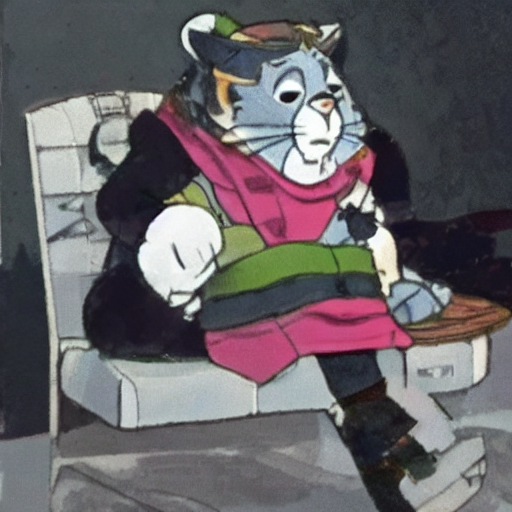

In [ ]:
torch.cuda.empty_cache()
prompt = "<matroskin> is sitting"

image = pipe_trained(
    prompt=prompt,
    num_inference_steps=30,
    guidance_scale=7.0,
    height=512,
    width=512,
).images[0]
display(image)
del image

  0%|          | 0/30 [00:00<?, ?it/s]

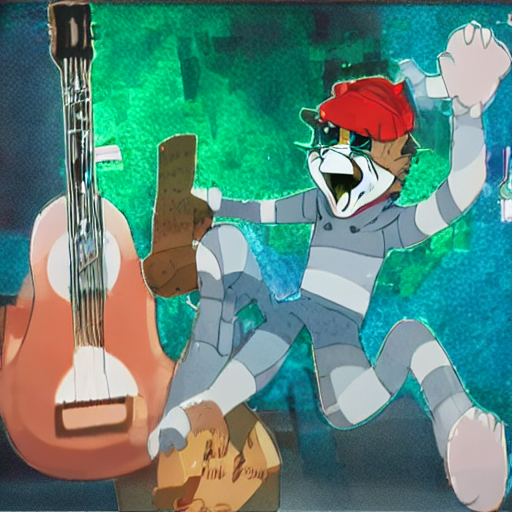

In [ ]:
prompt = "<matroskin> is excited"

image = pipe_trained(
    prompt=prompt,
    num_inference_steps=30,
    guidance_scale=7.0,
    height=512,
    width=512,
).images[0]
display(image)
del image

  0%|          | 0/30 [00:00<?, ?it/s]

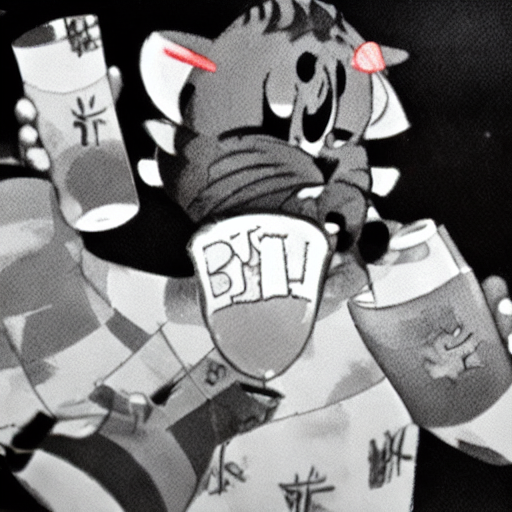

In [ ]:
prompt = "<matroskin> is drinking milk"

image = pipe_trained(
    prompt=prompt,
    num_inference_steps=30,
    guidance_scale=7.0,
    height=512,
    width=512,
).images[0]
display(image)
del image

**4.** Сгенерируйте изображения, используя те же промпты, что предыдущем пункте, только уберите из них токен, соответствующий Матроскину, заменив его на кота. Оцените качество сохранности модели.

  0%|          | 0/30 [00:00<?, ?it/s]

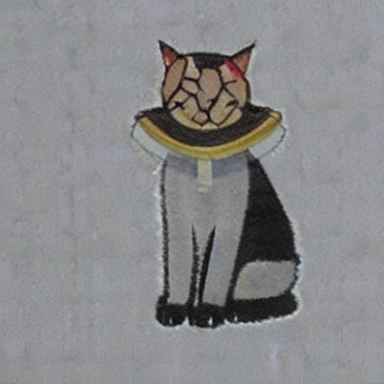

In [ ]:
torch.cuda.empty_cache()
prompt = "cat is sitting"

image = pipe_trained(
    prompt=prompt,
    num_inference_steps=30,
    guidance_scale=7.0,
    height=384,
    width=384,
).images[0]
display(image)
del image

  0%|          | 0/30 [00:00<?, ?it/s]

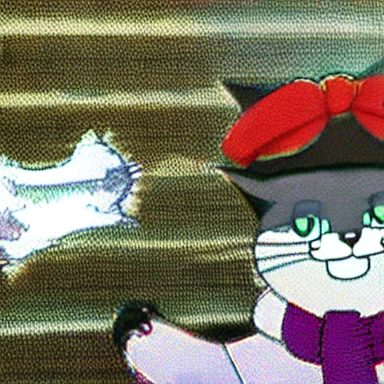

In [ ]:
prompt = "cat is excited"

image = pipe_trained(
    prompt=prompt,
    num_inference_steps=30,
    guidance_scale=7.0,
    height=384,
    width=384,
).images[0]
display(image)
del image

**5.** Обучите модель с двумя разными весами для лосса сохранности, за него отвечает параметр `prior_loss_weight`. Оцените качество генераций аналогично пунктам 3 и 4. Сделайте вывод о влиянии этого лосса на итоговый результат.

In [ ]:
CONFIGS = [
    {
        "name": "Слабый preservation (0.01)",
        "prior_loss_weight": 0.01,
    },
    {
        "name": "Сильный preservation (0.1)",
        "prior_loss_weight": 0.1,
    }
]
TOKEN = "<matroskin>"
def load_fresh_models():
    """Загружает чистую модель без LoRA"""
    
    torch.cuda.empty_cache()
    gc.collect()
    
    pipe = StableDiffusionPipeline.from_pretrained(
        "runwayml/stable-diffusion-v1-5",
        torch_dtype=torch.bfloat16,
        safety_checker=None
    )
    
    pipe_original = StableDiffusionPipeline.from_pretrained(
        "runwayml/stable-diffusion-v1-5",
        torch_dtype=torch.bfloat16,
        safety_checker=None
    )
    
    return pipe, pipe_original

def add_lora_to_unet(pipe):
    """Добавляет LoRA к свежему unet"""
    lora_config = LoraConfig(
        r=8,
        lora_alpha=16,
        target_modules=["to_k", "to_q", "to_v", "to_out.0", "add_k_proj", "add_v_proj"],
        init_lora_weights="gaussian",
    )

    pipe.unet.requires_grad_(False)
    unet = get_peft_model(pipe.unet, lora_config)
    print(f"✅ LoRA добавлена, обучаемых параметров: {sum(p.numel() for p in unet.parameters() if p.requires_grad)}")
    
    return unet

def train_and_generate(pipe, pipe_original, unet, prior_loss_weight, config_name):
    """Обучает и сразу генерирует 4 фото"""
    pipe.unet = unet
    
    pipe, _ = dreambooth_train_with_validation(
        pipe=pipe,
        pipe_original=pipe_original,
        train_loader=train_loader,
        num_epochs=150,
        preservation_weight=prior_loss_weight,
        use_bf16=True,
        lr=5e-4
    )
    
    print(f"\n🎨 Генерация изображений для {config_name}...")
    
    pipe = pipe.to(torch.bfloat16)
    pipe.unet.eval()
    
    test_prompts = [
        f"{TOKEN} is sitting",
        f"{TOKEN} is excited", 
        "cat is sitting",
        "cat is excited"
    ]
    
    images = []
    for prompt in test_prompts:
        image = pipe(
            prompt=prompt,
            num_inference_steps=30,
            guidance_scale=7.0,
            height=512,
            width=512,
            generator=torch.Generator().manual_seed(42)
        ).images[0]
        images.append((image, prompt))
    
    del pipe, pipe_original, unet
    torch.cuda.empty_cache()
    gc.collect()
    
    return images

def display_image_grid(images_with_captions, title):
    """Показывает 4 картинки в сетке с подписями"""
    fig, axes = plt.subplots(2, 2, figsize=(12, 12))
    fig.suptitle(title, fontsize=16, fontweight='bold')
    
    for idx, (image, caption) in enumerate(images_with_captions):
        row = idx // 2
        col = idx % 2
        
        axes[row, col].imshow(image)
        axes[row, col].set_title(caption, fontsize=10, pad=10)
        axes[row, col].axis('off')
    
    plt.tight_layout()
    plt.show()

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


✅ LoRA добавлена, обучаемых параметров: 1594368
🔥 Начало обучения. Параметров: 1,594,368
📊 Эпох: 150, Батчей: 4, Всего шагов: 600
Epoch 00 | Batch 0/4 | Loss: 0.1816 (R:0.1816, P:0.0005)
Epoch 01 | Batch 0/4 | Loss: 0.0534 (R:0.0534, P:0.0046)
Epoch 02 | Batch 0/4 | Loss: 0.0564 (R:0.0564, P:0.0032)
Epoch 03 | Batch 0/4 | Loss: 0.0510 (R:0.0509, P:0.0035)
Epoch 04 | Batch 0/4 | Loss: 0.0723 (R:0.0722, P:0.0066)
Epoch 05 | Batch 0/4 | Loss: 0.0746 (R:0.0745, P:0.0079)
Epoch 06 | Batch 0/4 | Loss: 0.0596 (R:0.0596, P:0.0057)
Epoch 07 | Batch 0/4 | Loss: 0.0067 (R:0.0067, P:0.0005)
Epoch 08 | Batch 0/4 | Loss: 0.1763 (R:0.1762, P:0.0152)
Epoch 09 | Batch 0/4 | Loss: 0.0417 (R:0.0416, P:0.0036)
Epoch 10 | Batch 0/4 | Loss: 0.2471 (R:0.2469, P:0.0201)
Epoch 11 | Batch 0/4 | Loss: 0.1034 (R:0.1033, P:0.0112)
Epoch 12 | Batch 0/4 | Loss: 0.1187 (R:0.1186, P:0.0089)
Epoch 13 | Batch 0/4 | Loss: 0.0250 (R:0.0249, P:0.0028)
Epoch 14 | Batch 0/4 | Loss: 0.1022 (R:0.1020, P:0.0129)
Epoch 15 | Batc

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

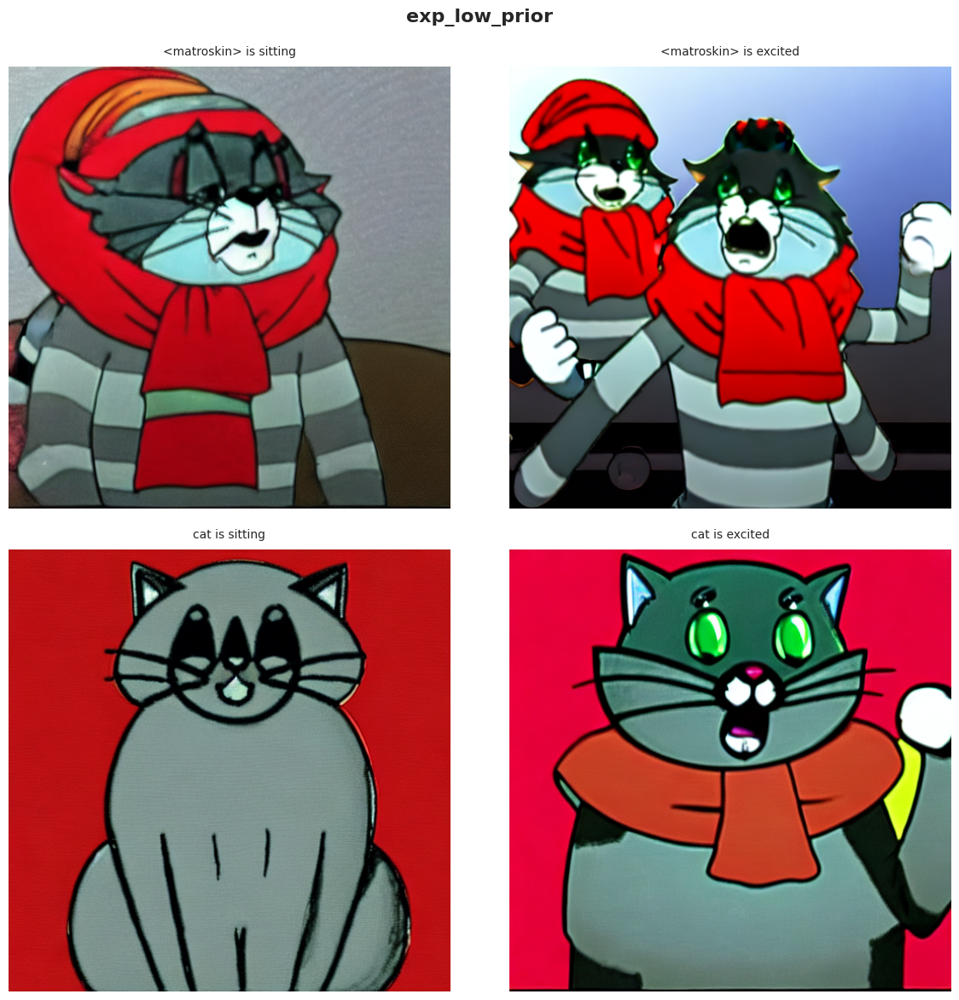

In [ ]:
del pipe, pipe_original, pipe_trained

pipe, pipe_original = load_fresh_models()
unet = add_lora_to_unet(pipe)

images_exp1 = train_and_generate(
    pipe=pipe,
    pipe_original=pipe_original,
    unet=unet,
    prior_loss_weight=0.01,
    config_name="exp_low_prior"
)

display_image_grid(images_exp1, "exp_low_prior")

Как видим, если вес preservation loss маленький, то модель начинает переобучаться на наш объект, что в итоге выливается в недостаточное разнобразие картинок.

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


✅ LoRA добавлена, обучаемых параметров: 1594368
🔥 Начало обучения. Параметров: 1,594,368
📊 Эпох: 150, Батчей: 4, Всего шагов: 600
Epoch 00 | Batch 0/4 | Loss: 0.0310 (R:0.0286, P:0.0008)
Epoch 01 | Batch 0/4 | Loss: 0.0985 (R:0.0942, P:0.0014)
Epoch 02 | Batch 0/4 | Loss: 0.1057 (R:0.1011, P:0.0015)
Epoch 03 | Batch 0/4 | Loss: 0.0430 (R:0.0400, P:0.0010)
Epoch 04 | Batch 0/4 | Loss: 0.0355 (R:0.0337, P:0.0006)
Epoch 05 | Batch 0/4 | Loss: 0.0748 (R:0.0693, P:0.0018)
Epoch 06 | Batch 0/4 | Loss: 0.0154 (R:0.0147, P:0.0002)
Epoch 07 | Batch 0/4 | Loss: 0.0386 (R:0.0344, P:0.0014)
Epoch 08 | Batch 0/4 | Loss: 0.0714 (R:0.0668, P:0.0015)
Epoch 09 | Batch 0/4 | Loss: 0.0892 (R:0.0833, P:0.0020)
Epoch 10 | Batch 0/4 | Loss: 0.0772 (R:0.0732, P:0.0013)
Epoch 11 | Batch 0/4 | Loss: 0.0693 (R:0.0656, P:0.0012)
Epoch 12 | Batch 0/4 | Loss: 0.0791 (R:0.0750, P:0.0014)
Epoch 13 | Batch 0/4 | Loss: 0.1330 (R:0.1238, P:0.0031)
Epoch 14 | Batch 0/4 | Loss: 0.0411 (R:0.0389, P:0.0007)
Epoch 15 | Batc

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

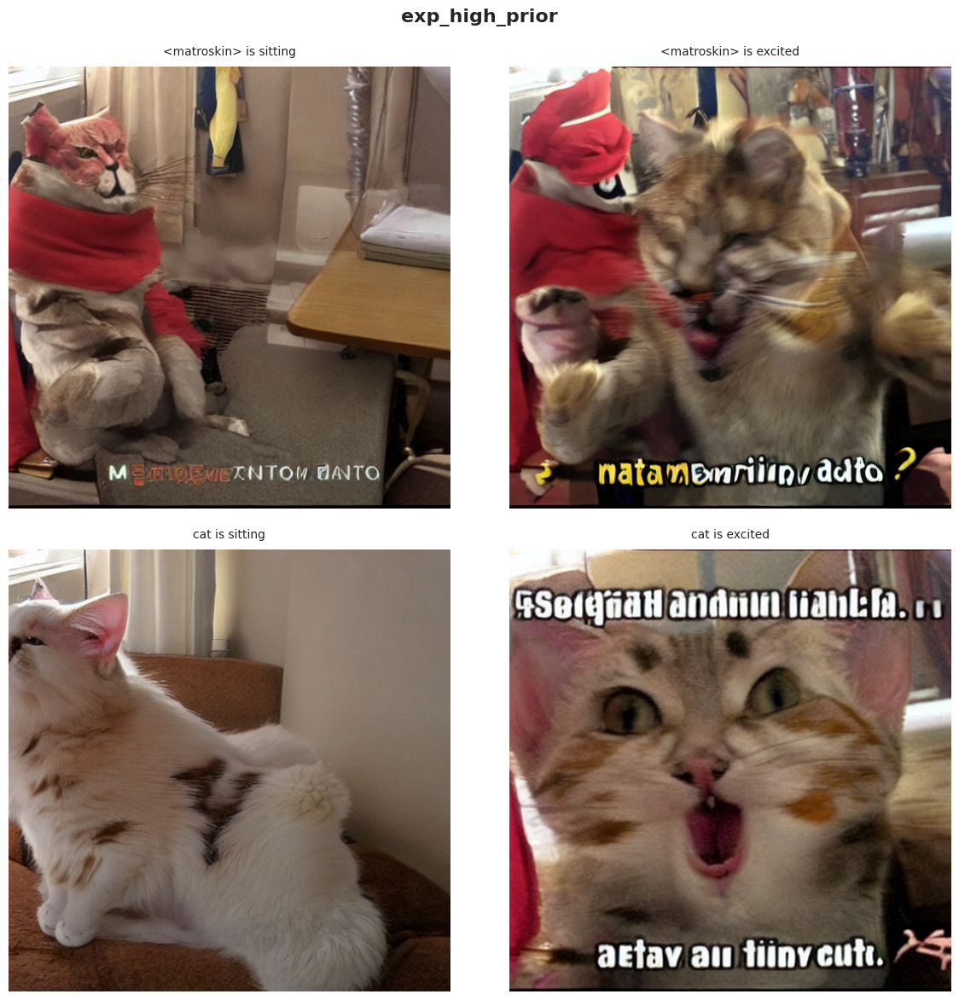

In [ ]:
del pipe, pipe_original

pipe, pipe_original = load_fresh_models()
unet = add_lora_to_unet(pipe)

images_exp2 = train_and_generate(
    pipe=pipe,
    pipe_original=pipe_original,
    unet=unet,
    prior_loss_weight=3.0,
    config_name="exp_high_prior"
)

display_image_grid(images_exp2, "exp_high_prior")

Теперь модель вообще не выучила кота Матроскина. Как видим, вес preservation лосса позволяет контроллировать, на сколько модель хорошо выучивает наш объект.

Впрочем в первый раз мы достигли баланса, когда взяли вес равный 1.

**6.** Если качество генераций ни в одном из экспериментов не получилось удовлетворительным, предложите свои варианты решения проблемы и реализуйте их. Это может быть, например, предобработка изображений, уточнение промптов, подкрутка параметров обучения модели.

В виду успеха наших экспериментов, я не буду выполнять этот пункт. Лишь отмечу, что при обучении я итак активно применил часть указанных советов.

**7.**
Оцените как сильно изменились параметры лучшей модели до и после дообучения. Определите слои, в которых веса модели поменялись больше всего. Как можно интерпретировать полученный результат?


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


✅ LoRA добавлена, обучаемых параметров: 1594368
🔥 Начало обучения. Параметров: 1,594,368
📊 Эпох: 150, Батчей: 4, Всего шагов: 600
Epoch 00 | Batch 0/4 | Loss: 0.0431 (R:0.0422, P:0.0010)
Epoch 01 | Batch 0/4 | Loss: 0.0424 (R:0.0405, P:0.0020)
Epoch 02 | Batch 0/4 | Loss: 0.0126 (R:0.0124, P:0.0002)
Epoch 03 | Batch 0/4 | Loss: 0.1985 (R:0.1933, P:0.0052)
Epoch 04 | Batch 0/4 | Loss: 0.0536 (R:0.0521, P:0.0015)
Epoch 05 | Batch 0/4 | Loss: 0.0277 (R:0.0266, P:0.0011)
Epoch 06 | Batch 0/4 | Loss: 0.0553 (R:0.0524, P:0.0029)
Epoch 07 | Batch 0/4 | Loss: 0.0609 (R:0.0586, P:0.0024)
Epoch 08 | Batch 0/4 | Loss: 0.0461 (R:0.0446, P:0.0015)
Epoch 09 | Batch 0/4 | Loss: 0.1047 (R:0.0992, P:0.0055)
Epoch 10 | Batch 0/4 | Loss: 0.0277 (R:0.0264, P:0.0014)
Epoch 11 | Batch 0/4 | Loss: 0.0417 (R:0.0397, P:0.0020)
Epoch 12 | Batch 0/4 | Loss: 0.0483 (R:0.0464, P:0.0019)
Epoch 13 | Batch 0/4 | Loss: 0.1690 (R:0.1633, P:0.0057)
Epoch 14 | Batch 0/4 | Loss: 0.0508 (R:0.0485, P:0.0023)
Epoch 15 | Batc

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

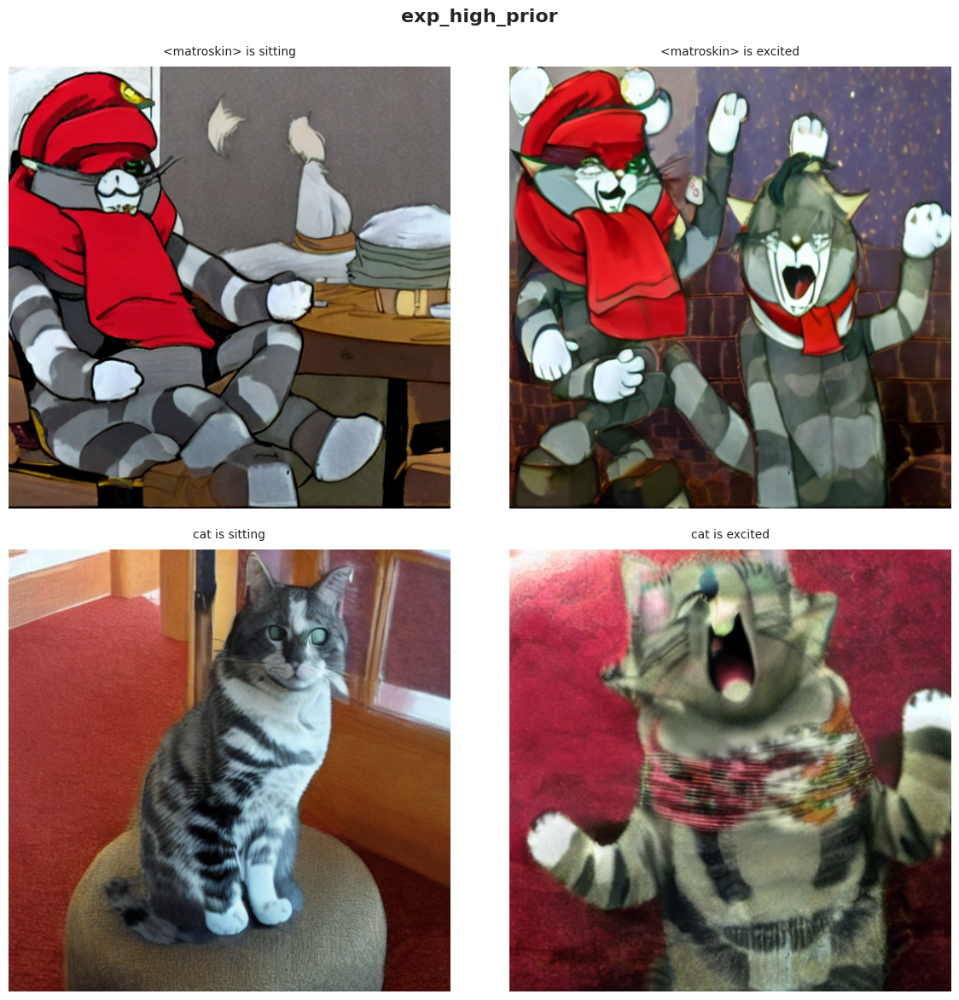

In [ ]:
del pipe, pipe_original

pipe, pipe_original = load_fresh_models()
unet = add_lora_to_unet(pipe)

images_exp2 = train_and_generate(
    pipe=pipe,
    pipe_original=pipe_original,
    unet=unet,
    prior_loss_weight=1.0,
    config_name="exp_high_prior"
)

display_image_grid(images_exp2, "exp_high_prior")

In [ ]:
def analyze_lora_changes(pipe, pipe_original, save_path="./lora_analysis_fixed.png", max_layers=20):
    if hasattr(pipe.unet, 'peft_config'):
        pass

    unet_sd = pipe.unet.state_dict()
    original_sd = pipe_original.unet.state_dict()
    
    lora_pairs = {}
    
    for key in unet_sd.keys():
        if 'lora_A' in key:
            base_key = key
            for prefix in ['base_model.model.', 'model.']:
                if base_key.startswith(prefix):
                    base_key = base_key[len(prefix):]
                    break
            if '.lora_A.default.weight' in base_key:
                base_key = base_key.replace('.lora_A.default.weight', '')
            elif '.lora_A.weight' in base_key:
                base_key = base_key.replace('.lora_A.weight', '')
            if base_key not in lora_pairs:
                lora_pairs[base_key] = {'A': None, 'B': None}
            lora_pairs[base_key]['A'] = key
        
        elif 'lora_B' in key:
            base_key = key
            for prefix in ['base_model.model.', 'model.']:
                if base_key.startswith(prefix):
                    base_key = base_key[len(prefix):]
                    break
            if '.lora_B.default.weight' in base_key:
                base_key = base_key.replace('.lora_B.default.weight', '')
            elif '.lora_B.weight' in base_key:
                base_key = base_key.replace('.lora_B.weight', '')
            if base_key not in lora_pairs:
                lora_pairs[base_key] = {'A': None, 'B': None}
            lora_pairs[base_key]['B'] = key
    
    complete_layers = []
    
    for base_key, pair in lora_pairs.items():
        if pair['A'] is not None and pair['B'] is not None:
            possible_base_names = [
                base_key + '.weight',
                base_key,
            ]
            base_weight_key = None
            for name in possible_base_names:
                if name in original_sd:
                    base_weight_key = name
                    break
            if base_weight_key:
                complete_layers.append({
                    'base_key': base_key,
                    'lora_A_key': pair['A'],
                    'lora_B_key': pair['B'],
                    'base_weight_key': base_weight_key
                })
    
    if not complete_layers:
        return None
    
    if len(complete_layers) > max_layers:
        complete_layers = complete_layers[:max_layers]
    
    n_layers = len(complete_layers)
    cols = 2
    rows = (n_layers + cols - 1) // cols
    
    fig, axes = plt.subplots(rows, cols, figsize=(16, rows * 4))
    if rows == 1 and cols == 1:
        axes = np.array([axes])
    axes = axes.flatten()
    
    layer_stats = []
    
    for idx, layer_info in enumerate(complete_layers):
        try:
            lora_A = unet_sd[layer_info['lora_A_key']].cpu().float()
            lora_B = unet_sd[layer_info['lora_B_key']].cpu().float()
            base_W = original_sd[layer_info['base_weight_key']].cpu().float()
            
            r = 8
            alpha = 16
            scaling = alpha / r
            
            if len(lora_A.shape) == 2 and len(lora_B.shape) == 2:
                delta_W = scaling * torch.mm(lora_B, lora_A)
            elif len(lora_A.shape) == 1 and len(lora_B.shape) == 2:
                delta_W = scaling * torch.mm(lora_B, lora_A.unsqueeze(0))
            elif len(lora_A.shape) == 2 and len(lora_B.shape) == 1:
                delta_W = scaling * torch.mm(lora_B.unsqueeze(1), lora_A)
            else:
                continue
            
            if delta_W.shape != base_W.shape:
                if delta_W.shape == base_W.shape[::-1]:
                    delta_W = delta_W.t()
                else:
                    continue
            
            base_norm = torch.norm(base_W).item()
            delta_norm = torch.norm(delta_W).item()
            
            if base_norm > 0:
                change_percent = (delta_norm / base_norm) * 100
            else:
                change_percent = 0
            
            try:
                cos_sim = F.cosine_similarity(
                    delta_W.flatten().unsqueeze(0),
                    base_W.flatten().unsqueeze(0)
                ).item()
            except:
                cos_sim = 0
            
            layer_stats.append({
                'layer': layer_info['base_key'],
                'change_percent': change_percent,
                'cosine_sim': cos_sim,
                'base_norm': base_norm,
                'delta_norm': delta_norm,
                'base_shape': tuple(base_W.shape),
                'delta_shape': tuple(delta_W.shape)
            })
            
            ax = axes[idx]
            base_vals = base_W.detach().numpy().flatten()
            delta_vals = delta_W.detach().numpy().flatten()
            all_vals = np.concatenate([base_vals, delta_vals])
            val_range = (np.percentile(all_vals, 1), np.percentile(all_vals, 99))
            ax.hist(base_vals, bins=50, alpha=0.5, range=val_range, color='blue', density=True)
            ax.hist(delta_vals, bins=50, alpha=0.5, range=val_range, color='red', density=True)
            ax.set_title(f"{layer_info['base_key'].split('.')[-3:]}\nΔ={change_percent:.1f}%", fontsize=9)
            ax.set_xlabel('Weight value')
            ax.set_ylabel('Density')
            ax.grid(True, alpha=0.3)
            
        except:
            continue
    
    for idx in range(len(complete_layers), len(axes)):
        axes[idx].set_visible(False)
    
    plt.suptitle(f'Анализ LoRA слоев (первые {len(complete_layers)} из {len(lora_pairs)})', 
                fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.savefig(save_path, dpi=150, bbox_inches='tight')
    plt.show()
    
    if layer_stats:
        layer_stats.sort(key=lambda x: x['change_percent'], reverse=True)
        
        stats_file = save_path.replace('.png', '_stats.json')
        with open(stats_file, 'w') as f:
            json.dump(layer_stats, f, indent=2, default=str)
        
        fig2, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
        
        changes = [s['change_percent'] for s in layer_stats]
        ax1.hist(changes, bins=30, alpha=0.7, color='green')
        ax1.axvline(np.mean(changes), color='red', linestyle='--')
        ax1.set_xlabel('Изменение весов (%)')
        ax1.set_ylabel('Количество слоев')
        ax1.grid(True, alpha=0.3)
        
        cos_sims = [s['cosine_sim'] for s in layer_stats]
        ax2.hist(cos_sims, bins=30, alpha=0.7, color='purple')
        ax2.axvline(np.mean(cos_sims), color='red', linestyle='--')
        ax2.set_xlabel('Косинусная близость')
        ax2.set_ylabel('Количество слоев')
        ax2.grid(True, alpha=0.3)
        
        plt.tight_layout()
        plt.savefig(save_path.replace('.png', '_summary.png'), dpi=150, bbox_inches='tight')
        plt.show()
    
    return layer_stats

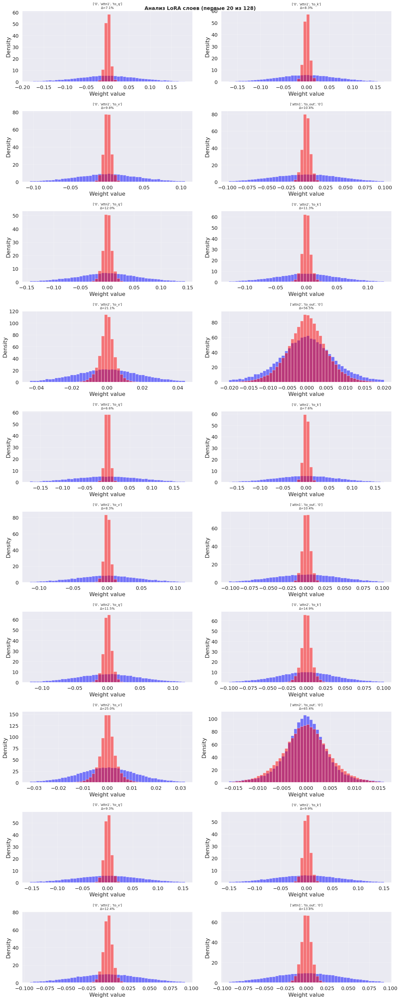

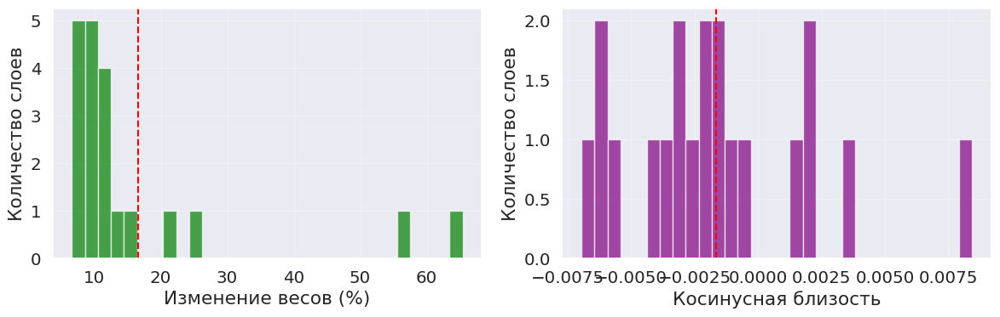

In [ ]:
analyze_lora_changes(pipe, pipe_original);

Как видим, веса изменились достаточно сильно, причем это сказывается именно на уменьшении дисперсии, то есть наша модель стала менее разнообразной, что ожидаемо.

**Выводы:** 

Мы успешно провели эксперименты с dream

---
© 2025 команда <a href="https://thetahat.ru/">ThetaHat</a> для DS-потока